# PRÁCTICO NO SUPERVISADO



---



Utilizar la base de jugadores “players_22.csv” disponible en la página de Kaggle https://www.kaggle.com/datasets/stefanoleone992/fifa-22-complete-player-dataset . Considerar que la base 2022 no tiene el mismo formato que la base vista en clase, a los nombres de las variables se les agregó una keyword para identificar a qué tipo de habilidad corresponde.

Con la nueva base, realizar un análisis análogo al que realizamos en el cursado de la materia con los datos FIFA2019. Realice comentarios en cada parte.

1. Análisis exploratorio de la base.
2. Evaluación visual  e intuitiva de a dos variables numéricas por vez.
3. Uso de dos técnicas de clustering: por ejemplo k-medias, DBSCAN, mezcla de Gaussianas y/o alguna jerárquica. Elección justificada de hiper-parámetros
4. Evaluación y Análisis de los clusters encontrados.
5. Pregunta: ¿Se realizó alguna normalización o escalado de la base? ¿Por qué ?
6. Uso de alguna transformación (proyección, Embedding) para visualizar los resultados y/o usarla como preprocesado para aplicar alguna técnica de clustering.


In [ ]:
import numpy as np
import pandas as pd
pd.set_option('display.max_columns',100)
pd.set_option('display.max_rows',1000)
import itertools
import warnings
warnings.filterwarnings("ignore")
import io

from plotly.offline import init_notebook_mode, plot,iplot
import plotly.graph_objs as go
init_notebook_mode(connected=True)
import matplotlib.pyplot as plt
import plotly.tools as tls #visualization
import plotly.figure_factory as ff #visualization
import seaborn as sns
sns.despine()

from sklearn.cluster import KMeans,MeanShift
from sklearn import decomposition

<Figure size 432x288 with 0 Axes>

## Analisis Exploratorio de la Base

Importamos la base de datos:

In [ ]:
url = 'https://raw.githubusercontent.com/NataliaGrasselli/DiploDatos2022/main/players_22.csv'
df = pd.read_csv(url)

La base contiene información sobre 110 atributos de 19,239 jugadores del FIFA 22.

In [ ]:
df[:3]

,sofifa_id,player_url,short_name,long_name,player_positions,overall,potential,value_eur,wage_eur,age,dob,height_cm,weight_kg,club_team_id,club_name,league_name,league_level,club_position,club_jersey_number,club_loaned_from,club_joined,club_contract_valid_until,nationality_id,nationality_name,nation_team_id,nation_position,nation_jersey_number,preferred_foot,weak_foot,skill_moves,international_reputation,work_rate,body_type,real_face,release_clause_eur,player_tags,player_traits,pace,shooting,passing,dribbling,defending,physic,attacking_crossing,attacking_finishing,attacking_heading_accuracy,attacking_short_passing,attacking_volleys,skill_dribbling,skill_curve,...,power_stamina,power_strength,power_long_shots,mentality_aggression,mentality_interceptions,mentality_positioning,mentality_vision,mentality_penalties,mentality_composure,defending_marking_awareness,defending_standing_tackle,defending_sliding_tackle,goalkeeping_diving,goalkeeping_handling,goalkeeping_kicking,goalkeeping_positioning,goalkeeping_reflexes,goalkeeping_speed,ls,st,rs,lw,lf,cf,rf,rw,lam,cam,ram,lm,lcm,cm,rcm,rm,lwb,ldm,cdm,rdm,rwb,lb,lcb,cb,rcb,rb,gk,player_face_url,club_logo_url,club_flag_url,nation_logo_url,nation_flag_url
0,158023,https://sofifa.com/player/158023/lionel-messi/...,L. Messi,Lionel Andrés Messi Cuccittini,"RW, ST, CF",93,93,78000000.0,320000.0,34,1987-06-24,170,72,73.0,Paris Saint-Germain,French Ligue 1,1.0,RW,30.0,NaN,2021-08-10,2023.0,52,Argentina,1369.0,RW,10.0,Left,4,4,5,Medium/Low,Unique,Yes,144300000.0,"#Dribbler, #Distance Shooter, #FK Specialist, ...","Finesse Shot, Long Shot Taker (AI), Playmaker ...",85.0,92.0,91.0,95.0,34.0,65.0,85,95,70,91,88,96,93,...,72,69,94,44,40,93,95,75,96,20,35,24,6,11,15,14,8,NaN,89+3,89+3,89+3,92,93,93,93,92,93,93,93,91+2,87+3,87+3,87+3,91+2,66+3,64+3,64+3,64+3,66+3,61+3,50+3,50+3,50+3,61+3,19+3,https://cdn.sofifa.net/players/158/023/22_120.png,https://cdn.sofifa.net/teams/73/60.png,https://cdn.sofifa.net/flags/fr.png,https://cdn.sofifa.net/teams/1369/60.png,https://cdn.sofifa.net/flags/ar.png
1,188545,https://sofifa.com/player/188545/robert-lewand...,R. Lewandowski,Robert Lewandowski,ST,92,92,119500000.0,270000.0,32,1988-08-21,185,81,21.0,FC Bayern München,German 1. Bundesliga,1.0,ST,9.0,NaN,2014-07-01,2023.0,37,Poland,1353.0,RS,9.0,Right,4,4,5,High/Medium,Unique,Yes,197200000.0,"#Aerial Threat, #Distance Shooter, #Clinical F...","Solid Player, Finesse Shot, Outside Foot Shot,...",78.0,92.0,79.0,86.0,44.0,82.0,71,95,90,85,89,85,79,...,76,86,87,81,49,95,81,90,88,35,42,19,15,6,12,8,10,NaN,90+2,90+2,90+2,85,88,88,88,85,86+3,86+3,86+3,84+3,80+3,80+3,80+3,84+3,64+3,66+3,66+3,66+3,64+3,61+3,60+3,60+3,60+3,61+3,19+3,https://cdn.sofifa.net/players/188/545/22_120.png,https://cdn.sofifa.net/teams/21/60.png,https://cdn.sofifa.net/flags/de.png,https://cdn.sofifa.net/teams/1353/60.png,https://cdn.sofifa.net/flags/pl.png
2,20801,https://sofifa.com/player/20801/c-ronaldo-dos-...,Cristiano Ronaldo,Cristiano Ronaldo dos Santos Aveiro,"ST, LW",91,91,45000000.0,270000.0,36,1985-02-05,187,83,11.0,Manchester United,English Premier League,1.0,ST,7.0,NaN,2021-08-27,2023.0,38,Portugal,1354.0,ST,7.0,Right,4,5,5,High/Low,Unique,Yes,83300000.0,"#Aerial Threat, #Dribbler, #Distance Shooter, ...","Power Free-Kick, Flair, Long Shot Taker (AI), ...",87.0,94.0,80.0,88.0,34.0,75.0,87,95,90,80,86,88,81,...,77,77,93,63,29,95,76,88,95,24,32,24,7,11,15,14,11,NaN,90+1,90+1,90+1,88,89,89,89,88,86+3,86+3,86+3,86+3,78+3,78+3,78+3,86+3,63+3,59+3,59+3,59+3,63+3,60+3,53+3,53+3,53+3,60+3,20+3,https://cdn.sofifa.net/players/020/801/22_120.png,https://cdn.sofifa.net/teams/11/60.png,https://cdn.sofifa.net/flags/gb-eng.png,https://cdn.sofifa.net/teams/1354/60.png,https://cdn.sofifa.net/flags/pt.png


In [ ]:
print(df.columns.tolist())
print(len(df.columns), 'variables')

['sofifa_id', 'player_url', 'short_name', 'long_name', 'player_positions', 'overall', 'potential', 'value_eur', 'wage_eur', 'age', 'dob', 'height_cm', 'weight_kg', 'club_team_id', 'club_name', 'league_name', 'league_level', 'club_position', 'club_jersey_number', 'club_loaned_from', 'club_joined', 'club_contract_valid_until', 'nationality_id', 'nationality_name', 'nation_team_id', 'nation_position', 'nation_jersey_number', 'preferred_foot', 'weak_foot', 'skill_moves', 'international_reputation', 'work_rate', 'body_type', 'real_face', 'release_clause_eur', 'player_tags', 'player_traits', 'pace', 'shooting', 'passing', 'dribbling', 'defending', 'physic', 'attacking_crossing', 'attacking_finishing', 'attacking_heading_accuracy', 'attacking_short_passing', 'attacking_volleys', 'skill_dribbling', 'skill_curve', 'skill_fk_accuracy', 'skill_long_passing', 'skill_ball_control', 'movement_acceleration', 'movement_sprint_speed', 'movement_agility', 'movement_reactions', 'movement_balance', 'power

In [ ]:
#Dropeamos algunas columnas que no nos interesan
df.drop(columns=['long_name', 'player_url','player_face_url', 'club_logo_url', 'club_flag_url', 'nation_logo_url', 'nation_flag_url','real_face','dob',], inplace=True)

#### **Variable Overall**

La variable 'Overall' se calcula usando otras variables de desempeño del jugador (skills_ratings) y utilizando redondeo. La variable 'Overall' es numérica discreta, (pero de "naturaleza" continua) tomando valores enteros entre 0 y 100.


In [ ]:
df.overall.describe()

count    19239.000000
mean        65.772182
std          6.880232
min         47.000000
25%         61.000000
50%         66.000000
75%         70.000000
max         93.000000
Name: overall, dtype: float64

47


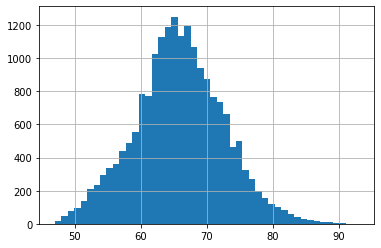

In [ ]:
nbins=1*(df.overall.max()-df.overall.min())+1
df['overall'].hist(bins = nbins)
print(nbins)

Estudiemos nuestro df en base a esta variable:

In [ ]:
#El mejor jugador segun su calificación overall 
df.iloc[df['overall'].idxmax()][['player_positions','short_name','overall']]

player_positions    RW, ST, CF
short_name            L. Messi
overall                     93
Name: 0, dtype: object

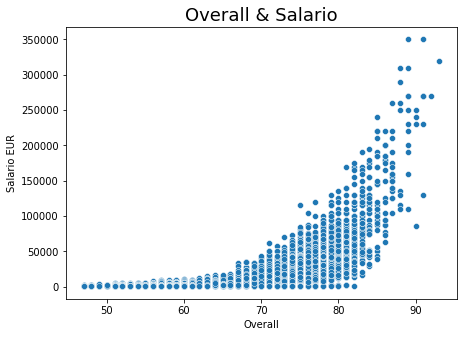

In [ ]:
#Overall y Salario del jugador

plt.figure(figsize=(7, 5))
ax = sns.scatterplot(x =df['overall'], y = df['wage_eur'])
plt.xlabel("Overall") 
plt.ylabel("Salario EUR")
plt.title("Overall & Salario", fontsize = 18)
plt.show()

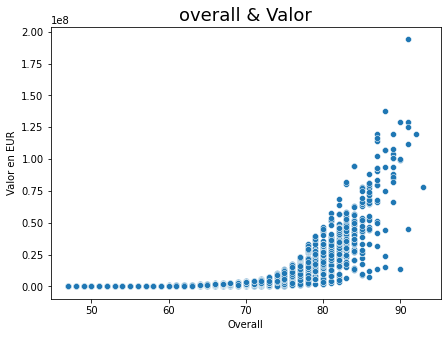

In [ ]:
#Overall y Valor del jugador

plt.figure(figsize=(7, 5))
ax = sns.scatterplot(x =df['overall'], y = df['value_eur'])
plt.xlabel("Overall") 
plt.ylabel("Valor en EUR")
plt.title("overall & Valor", fontsize = 18)
plt.show()

In [ ]:
#Mejores jugadores por posición en base a la variable overall
best_players_per_position=df.iloc[df.groupby(df['player_positions'])['overall'].idxmax()][['player_positions','short_name','overall']]
best_players_per_position[:5]

,player_positions,short_name,overall
28,CAM,Bruno Fernandes,88
2052,"CAM, CDM",P. Kasami,74
2711,"CAM, CDM, CM",A. Ricaurte,73
1589,"CAM, CDM, LM",Álex Fernández,75
8515,"CAM, CDM, RM",M. Miranda,67


In [ ]:
#Overall promedio por club
club_avg_overall=df.groupby("club_name")["overall"].mean().reset_index().sort_values("overall",ascending=False)
club_avg_overall.head(8)

,club_name,overall
368,Juventus,79.961538
470,Paris Saint-Germain,79.454545
358,Inter,78.857143
241,FC Bayern München,78.071429
412,Manchester United,78.000000
509,Real Madrid CF,77.757576
434,Napoli,77.500000
63,Atalanta,77.480000


Podríamos, por ejemplo, trabajar con el 25% de los mejores jugadores en base a su clasificación overall. Para ello, tomamos solo los jugadores que tengan una clasificación mayor a 70 puntos:

In [ ]:
#df con los mejores jugadores
df_best = df[df.overall > 70]

## Visualización de dos variables a la vez

#### **Calificación sobre Habilidades**

El df contiene, para cada jugador, una clasificación de 41 habilidades (como defensa, pases, velocidad, reacción, etc.). A continuación se enumeran todas las habilidades que se tiene en cuenta en el df:

In [ ]:
#Atributos referidos a las habilidades del jugador

skills_rating = ['pace', 'shooting', 'passing', 'dribbling', 'defending', 'physic', 
                   'attacking_crossing', 'attacking_finishing', 'attacking_heading_accuracy', 
                   'attacking_short_passing', 'attacking_volleys', 'skill_dribbling', 
                   'skill_curve', 'skill_fk_accuracy', 'skill_long_passing', 'skill_ball_control', 
                   'movement_acceleration', 'movement_sprint_speed', 'movement_agility', 
                   'movement_reactions', 'movement_balance', 'power_shot_power', 'power_jumping', 
                   'power_stamina', 'power_strength', 'power_long_shots', 'mentality_aggression', 
                   'mentality_interceptions', 'mentality_positioning', 'mentality_vision', 
                   'mentality_penalties', 'mentality_composure', 'defending_marking_awareness', 
                   'defending_standing_tackle', 'defending_sliding_tackle', 'goalkeeping_diving', 
                   'goalkeeping_handling', 'goalkeeping_kicking', 'goalkeeping_positioning', 
                   'goalkeeping_reflexes', 'goalkeeping_speed']

print(len(skills_rating), 'variables numéricas de desempeño según habilidad')

41 variables numéricas de desempeño según habilidad


Veamos ahora como se comportan estas variables:

In [ ]:
#Creamos un df solo con la info sobre los skills
df_skills = df_best[skills_rating]

In [ ]:
df_skills.describe()

,pace,shooting,passing,dribbling,defending,physic,attacking_crossing,attacking_finishing,attacking_heading_accuracy,attacking_short_passing,attacking_volleys,skill_dribbling,skill_curve,skill_fk_accuracy,skill_long_passing,skill_ball_control,movement_acceleration,movement_sprint_speed,movement_agility,movement_reactions,movement_balance,power_shot_power,power_jumping,power_stamina,power_strength,power_long_shots,mentality_aggression,mentality_interceptions,mentality_positioning,mentality_vision,mentality_penalties,mentality_composure,defending_marking_awareness,defending_standing_tackle,defending_sliding_tackle,goalkeeping_diving,goalkeeping_handling,goalkeeping_kicking,goalkeeping_positioning,goalkeeping_reflexes,goalkeeping_speed
count,4149.000000,4149.000000,4149.000000,4149.000000,4149.000000,4149.000000,4593.000000,4593.000000,4593.000000,4593.000000,4593.000000,4593.000000,4593.000000,4593.000000,4593.000000,4593.000000,4593.000000,4593.000000,4593.000000,4593.000000,4593.000000,4593.000000,4593.000000,4593.000000,4593.000000,4593.000000,4593.000000,4593.000000,4593.000000,4593.000000,4593.000000,4593.000000,4593.000000,4593.000000,4593.000000,4593.000000,4593.000000,4593.000000,4593.000000,4593.000000,444.000000
mean,70.754640,61.508074,66.729573,70.975175,58.852254,70.764040,58.539081,54.379708,58.895058,68.204659,51.389506,64.754844,57.428478,50.694100,62.662530,67.868278,68.033312,68.233181,68.194644,71.880688,66.395820,67.581755,68.996299,69.880253,70.008709,56.822121,64.157413,54.615720,59.258437,63.539952,54.755062,69.177008,54.231004,54.760941,51.781842,16.772480,16.588287,16.382539,16.734596,16.921184,43.799550
std,11.913889,13.640753,8.265726,8.034317,17.219780,8.262508,19.092449,20.736965,18.441365,13.691455,19.404293,18.790148,19.621255,19.266658,14.246775,16.244533,14.600173,14.350843,14.385996,5.602323,14.551366,11.734575,12.139747,15.174882,11.516668,20.163787,17.047454,21.840682,20.726463,13.164588,16.713052,9.318305,21.376009,22.960927,23.029671,19.415508,18.629108,18.018603,19.180326,19.864729,9.275707
min,28.000000,18.000000,35.000000,35.000000,18.000000,35.000000,6.000000,3.000000,7.000000,11.000000,4.000000,7.000000,6.000000,4.000000,9.000000,9.000000,15.000000,16.000000,19.000000,38.000000,20.000000,21.000000,29.000000,13.000000,28.000000,4.000000,11.000000,6.000000,3.000000,10.000000,8.000000,18.000000,5.000000,7.000000,7.000000,2.000000,2.000000,2.000000,2.000000,2.000000,15.000000
25%,64.000000,53.000000,62.000000,67.000000,42.000000,66.000000,50.000000,40.000000,51.000000,67.000000,37.000000,62.000000,46.000000,37.000000,58.000000,67.000000,60.000000,61.000000,61.000000,68.000000,58.000000,59.000000,62.000000,66.000000,64.000000,46.000000,55.000000,34.000000,51.000000,57.000000,44.000000,65.000000,35.000000,33.000000,29.000000,8.000000,8.000000,8.000000,8.000000,8.000000,38.000000
50%,72.000000,65.000000,68.000000,72.000000,67.000000,72.000000,65.000000,61.000000,63.000000,72.000000,56.000000,71.000000,63.000000,53.000000,66.000000,73.000000,70.000000,71.000000,71.000000,72.000000,69.000000,70.000000,71.000000,73.000000,71.000000,64.000000,69.000000,65.000000,67.000000,67.000000,57.000000,70.000000,64.000000,67.000000,62.000000,11.000000,11.000000,11.000000,11.000000,11.000000,44.000000
75%,79.000000,72.000000,72.000000,76.000000,73.000000,77.000000,72.000000,71.000000,72.000000,75.000000,67.000000,76.000000,72.000000,67.000000,72.000000,76.000000,78.000000,78.000000,78.000000,75.000000,77.000000,76.000000,77.000000,80.000000,78.000000,71.000000,76.000000,73.000000,74.000000,73.000000,67.000000,75.000000,72.000000,74.000000,72.000000,14.000000,14.000000,14.000000,14.000000,14.000000,50.000000
max,97.000000,94.000000,93.000000,95.000000,91.000000,90.000000,94.000000,95.000000,93.000000,94.000000,90.000000,96.000000,94.000000,94.000000,93.000000,96.000000,97.000000,97.000000,96.000000,94.000000,96.000000,95.000000,95.000000,97.000000,95.000000,94.000000,95.000000,91.000000,96.000000,95.000000,93.0

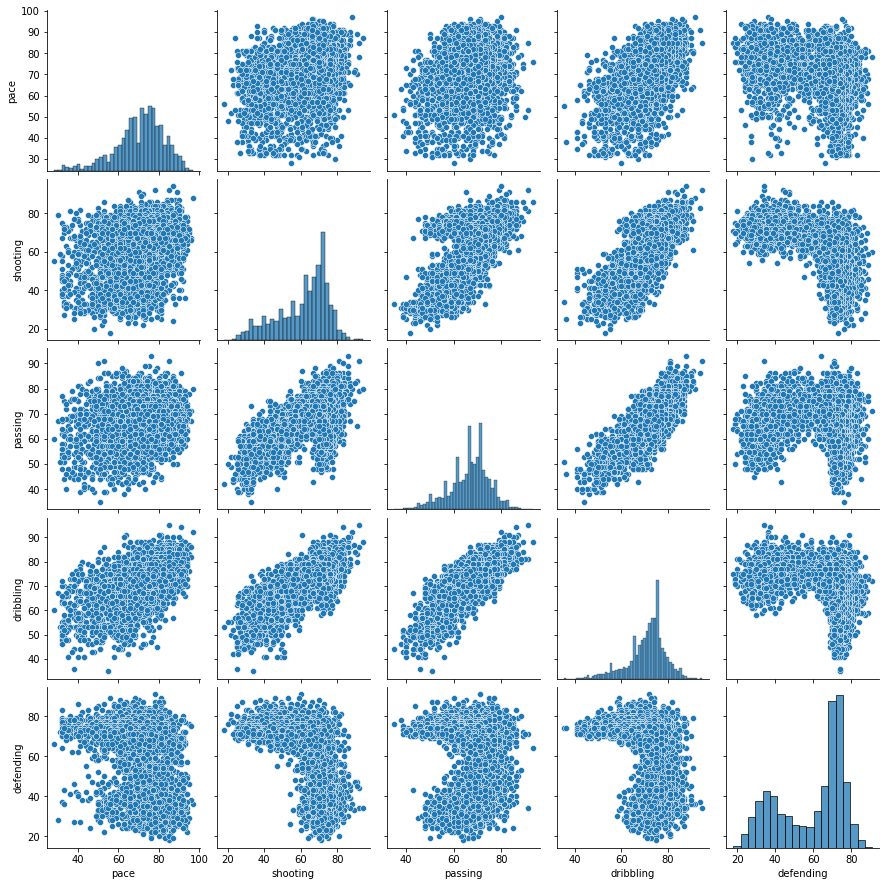

In [ ]:
sns.pairplot(df_skills[skills_rating[0:5]])

Visualizamos algunas de las habilidades de a pares:

> Shooting vs Attack Finishing

In [ ]:
#Elejimos dos variables
skill_1=skills_rating[1]  #shooting	
skill_2=skills_rating[7] #attacking_finishing

graf1 = go.Scatter(x=df_skills[skill_1], y=df_skills[skill_2],
                           mode='markers',
                          text=df_best.loc[:,'club_name'], #'Height', 'Weight', 'Club', 'Age', 'Name','Position'
                           marker=dict(
                                size=5)
                           )


layout = go.Layout(title="shooting y finishing",titlefont=dict(size=20),
                xaxis=dict(title=skill_1),
                yaxis=dict(title=skill_2),
                autosize=False, width=1000,height=650)

fig = go.Figure(data=graf1, layout=layout)

#En Colab
fig.show(renderer="colab")

> Distintos tipos de pases

In [ ]:
from plotly.subplots import make_subplots

skill_1 = 'passing' 
skill_2 = 'attacking_short_passing'
skill_3 = 'skill_long_passing'

fig = make_subplots(rows=1, cols=3, subplot_titles=("passing vs attack short passing", "pasing vs long passing", 'short passing vs long passing'))

# 'passing' vs 'attacking_short_passing'
fig.add_trace(go.Scatter(x=df_skills[skill_1], y=df_skills[skill_2],
                         mode='markers',text=df_best.loc[:,'short_name'],
                         marker=dict(size=5)), 
                row=1, col=1)
# 'passing' vs 'skill_long_passing' 
fig.add_trace(go.Scatter(x=df_skills[skill_1], y=df_skills[skill_3],
                         mode='markers',text=df_best.loc[:,'short_name'],
                         marker=dict(size=5)), 
                row=1, col=2)

# 'skill_long_passing' vs 'attacking_short_passing'
fig.add_trace(go.Scatter(x=df_skills[skill_3], y=df_skills[skill_2],
                         mode='markers',text=df_best.loc[:,'short_name'],
                         marker=dict(size=5)), 
                row=1, col=3)

# Update xaxis properties
fig.update_xaxes(title_text='passing', row=1, col=1)
fig.update_xaxes(title_text='passing', row=1, col=2)
fig.update_xaxes(title_text='skill_long_passing', row=1, col=3)


# Update yaxis properties
fig.update_yaxes(title_text="attacking_short_passing", row=1, col=1)
fig.update_yaxes(title_text='skill_long_passing', row=1, col=2)
fig.update_yaxes(title_text="attacking_short_passing", row=1, col=3)

fig.update_layout(title="Visualización habilidad de pases", titlefont=dict(size=20),autosize=False, width=1000,height=450)

fig.show(renderer="colab")

Acá podemos notar que la combinación attacking_short_passing y skill_long_passing parecería formar dos grupos separados. 

> Defensa

In [ ]:
skill_1 = 'defending'
skill_2 = 'defending_marking_awareness'
skill_3 = 'defending_standing_tackle'

fig = make_subplots(rows=1, cols=3, subplot_titles=("defending vs marking awareness", "defending vs standing tackle", 'marking awareness vs standing tackle'))

# 'passing' vs 'attacking_short_passing'
fig.add_trace(go.Scatter(x=df_skills[skill_1], y=df_skills[skill_2],
                         mode='markers',text=df_best.loc[:,'short_name'],
                         marker=dict(size=5)), 
                row=1, col=1)
# 'passing' vs 'skill_long_passing' 
fig.add_trace(go.Scatter(x=df_skills[skill_1], y=df_skills[skill_3],
                         mode='markers',text=df_best.loc[:,'short_name'],
                         marker=dict(size=5)), 
                row=1, col=2)

# 'skill_long_passing' vs 'attacking_short_passing'
fig.add_trace(go.Scatter(x=df_skills[skill_3], y=df_skills[skill_2],
                         mode='markers',text=df_best.loc[:,'short_name'],
                         marker=dict(size=5)), 
                row=1, col=3)

# Update xaxis properties
fig.update_xaxes(title_text='defending', row=1, col=1)
fig.update_xaxes(title_text='defending', row=1, col=2)
fig.update_xaxes(title_text='standing tackle', row=1, col=3)


# Update yaxis properties
fig.update_yaxes(title_text="marking awareness", row=1, col=1)
fig.update_yaxes(title_text='standing tackle', row=1, col=2)
fig.update_yaxes(title_text="marking awareness", row=1, col=3)

fig.update_layout(title="Visualización habilidad de defensa", titlefont=dict(size=20),autosize=False, width=1000,height=450)

fig.show(renderer="colab")

Hasta ahora todas las habilidades tenian correlaciones evidentes; es decir, suponemos que si un jugador es bueno en una de esas será bueno en las otras. 

Ahora veamos otras con menor correlación entre ellas: 

> Fuerza, Agresividad Mental, Control del Balón y Cabeceo

In [ ]:
skill_1 = 'power_strength'
skill_2 = 'mentality_aggression'
skill_3 = 'skill_ball_control'
skill_4 = 'attacking_heading_accuracy'

fig = make_subplots(rows=3, cols=2)

# 'power_strength' vs 'mentality_aggression'
fig.add_trace(go.Scatter(x=df_skills[skill_1], y=df_skills[skill_2],
                         mode='markers',text=df_best.loc[:,'short_name'],
                         marker=dict(size=5)), 
                row=1, col=1)

# 'power_strength' vs 'skill_ball_control'
fig.add_trace(go.Scatter(x=df_skills[skill_1], y=df_skills[skill_3],
                         mode='markers',text=df_best.loc[:,'short_name'],
                         marker=dict(size=5)), 
                row=1, col=2)

# 'power_strength' vs 'attacking_heading_accuracy'
fig.add_trace(go.Scatter(x=df_skills[skill_1], y=df_skills[skill_4],
                         mode='markers',text=df_best.loc[:,'short_name'],
                         marker=dict(size=5)), 
                row=2, col=1)

# 'mentality_aggression' vs 'skill_ball_control'
fig.add_trace(go.Scatter(x=df_skills[skill_2], y=df_skills[skill_3],
                         mode='markers',text=df_best.loc[:,'short_name'],
                         marker=dict(size=5)), 
                row=2, col=2)

# 'mentality_aggression' vs 'attacking_heading_accuracy'
fig.add_trace(go.Scatter(x=df_skills[skill_2], y=df_skills[skill_4],
                         mode='markers',text=df_best.loc[:,'short_name'],
                         marker=dict(size=5)), 
                row=3, col=1)

# 'skill_ball_control' vs 'attacking_heading_accuracy'
fig.add_trace(go.Scatter(x=df_skills[skill_3], y=df_skills[skill_4],
                         mode='markers',text=df_best.loc[:,'short_name'],
                         marker=dict(size=5)), 
                row=3, col=2)

# Update xaxis properties
fig.update_xaxes(title_text='power_strength', row=1, col=1)
fig.update_xaxes(title_text='power_strength', row=1, col=2)
fig.update_xaxes(title_text='power_strength', row=2, col=1)
fig.update_xaxes(title_text='mentality_aggression', row=2, col=2)
fig.update_xaxes(title_text='mentality_aggression', row=3, col=1)
fig.update_xaxes(title_text='skill_ball_control', row=3, col=2)

# Update yaxis properties
fig.update_yaxes(title_text="mentality_aggression", row=1, col=1)
fig.update_yaxes(title_text='skill_ball_control', row=1, col=2)
fig.update_yaxes(title_text="attacking_heading_accuracy", row=2, col=1)
fig.update_yaxes(title_text='skill_ball_control', row=2, col=2)
fig.update_yaxes(title_text="attacking_heading_accuracy", row=3, col=1)
fig.update_yaxes(title_text="attacking_heading_accuracy", row=3, col=2)

fig.update_layout(title="Visualización habilidad de defensa", titlefont=dict(size=20),autosize=False, width=1000,height=850)

fig.show(renderer="colab")

Aquí también se forman varios grupos separados a simple vista:


- Entre attacking_heading_accuracy y mentality aggression
- Entre attacking_heading_accuracy y skill_ball_control
- Entre attacking_heading_accuracy y power_strength
- Entre skill_ball_control y mentality aggression
- Entre skill_ball_control y power_strength

#### **Analisis de Posiciones**

Ahora vamos a analizar las distintas posiciones que puede ocupar un jugador. 

Lista de Posiciones:

* Defensa:
  - GK: Arquero (Goal Keeper)
  - RB: Defensor Lateral derecho (Right Back)
  - LB: Defensor Lateral Izquierdo (Left Back)
  - RWB: Carrillero Derecho (Right Wing Back: defenders with a heavier emphasis on attack)
  - LWB: Carrillero Izquierdo (Left Wing Back)
  - CB: Defensa Central (Centre-back)
  - RCB: Defensa Central Derecha (right centre back)
  - LCB: Defensa Central Izquierda (left centre back)

* Medio Campistas: 
  - CDM: Mediocampo Defensivo Central (Defensive midfielders)
  - LDM:  Mediocampo Defensivo Izquierdo (Left Defensive Midfielder)
  - RDM:  Mediocampo Defensivo Derecho (Right Defensive Midfielder)
  - CM: Mediocampista Central (midfielders)
  - LCM: Mediocampo Izquierdo (Left Midfielder)
  - RCM: Mediocampo Derecho (Izquierdo Midfielder)
  - CAM: Medio Centro Ofensivo (Attacking midfielders)
  - LAM: Medio Campo Ofensivo Izquierdo (Left Attacking Midfielder)
  - RAM: Medio Campo Ofensivo Derecho (Right Attacking Midfielder)
  - RM: Medio Derecho (Right Midfielders)
  - LM: Medio Izquierdo (Left Midfielders)

* Delanteros:
  - RW: Extremo Derecho (Right Wingers)
  - LF: Delantero Lateral Izquierdo (Left Forwards)
  - RF: Delantero Lateral Derecho (Right Forward)
  - CF: Media Punta (Centre-forwards)
  - ST: Striker central
  - LS: Left Striker
  - RS: Right Striker



Conteo por posiciones: Notamos que un jugador puede ocupar más de una posición

In [ ]:
pd.DataFrame(df_best.player_positions.value_counts().sort_index())[:10]

,player_positions
CAM,34
"CAM, CDM",2
"CAM, CDM, CM",1
"CAM, CDM, LM",1
"CAM, CF",16
"CAM, CF, CM",5
"CAM, CF, LM",2
"CAM, CF, LW",1
"CAM, CF, RM",1
"CAM, CF, ST",2


In [ ]:
df_positions = df_best.copy()

In [ ]:
#vamos a separar las posiciones en 3 columnas
def main_positions(input_df):
    input_df['position_1'] = input_df['player_positions'].str.split(',').str[0]
    input_df['position_2'] = input_df['player_positions'].str.split(',').str[1]
    input_df['position_3'] = input_df['player_positions'].str.split(',').str[2]  
    return input_df

In [ ]:
df_positions = main_positions(df_positions)

In [ ]:
df_positions[['position_1','position_2','position_3']][:3]

,position_1,position_2,position_3
0,RW,ST,CF
1,ST,NaN,NaN
2,ST,LW,NaN


Vamos a separar nuestros jugadores en 4 posiciones basicas: delanteros, mediocampistas, defensores y arqueros. 

In [ ]:
forwards=['lf', 'cf', 'rf','ls', 'st', 'rs',  'lw', 'rw']
midfielders=['cdm', 'ldm', 'rdm', 'cm', 'rm', 'lm', 'cam', 'lam', 'ram']
defenders=['rb', 'lb', 'rwb', 'lwb', 'cb', 'lcb', 'rcb']
goalkeepers=['gk']

def pos2(player_positions):

  positions = []

  for position in player_positions:
    try: 
      position = position.lower()
    except:
      positions.append('nan')    
    if position in forwards:
      positions.append('forward')
    elif position in midfielders:
      positions.append('midfielder')
    elif position in defenders:
      positions.append('defender')
    elif position in goalkeepers:
      positions.append('goalkeeper')
    else:
      positions.append('nan')

  return positions
     

In [ ]:
#Agregamos las nuevas posiciones agrupadas
df_positions['new_position'] = pos2(df_positions['position_1'])

Nuestro dataset, contiene una serie de variables que otorgan al jugador una calificación en base a cada posicion. 

In [ ]:
df_positions[['short_name','position_1','new_position']][:5]

,short_name,position_1,new_position
0,L. Messi,RW,forward
1,R. Lewandowski,ST,forward
2,Cristiano Ronaldo,ST,forward
3,Neymar Jr,LW,forward
4,K. De Bruyne,CM,midfielder


En un principio, podríamos suponer que las habilidades observadas anteriormente se relacionan con las distintas posiciones que ocupa un jugador. Por ejemplo, los delanteros deberían tener mayores habilidades de ataque; mientras que los defensores deberían tener mayores habilidades de defensa y los arqueros de goalkeeping.

Veamos si esto es así:

In [ ]:
# visualizamos 
sns.pairplot(df_positions,
              x_vars=['shooting', 'attacking_finishing', 'defending_marking_awareness',
                        'defending_standing_tackle', 'goalkeeping_handling', 'goalkeeping_kicking',
                        'mentality_aggression', 'power_strength', 'skill_long_passing'],
              y_vars=['shooting', 'attacking_finishing', 'defending_marking_awareness',
                        'defending_standing_tackle', 'goalkeeping_handling', 'goalkeeping_kicking',
                        'mentality_aggression', 'power_strength', 'skill_long_passing'],
              hue = 'new_position')

Output hidden; open in https://colab.research.google.com to view.

Notamos que en la mayoría de los casos, los jugadores de una misma posición se encuentran "cerca", los unos de otros, en terminos de cada variable. Por lo que podrían estar marcando diferentes clusters. 

##Preparación df para clustering

### Elección de variables para clustering

Consideramos que las variables más adecuadas para segmentar los jugadores estan relacionadas con el rating de sus habilidades.

In [ ]:
interesting_cols = ['preferred_foot', 'attacking_crossing', 'attacking_finishing', 'attacking_heading_accuracy', 
                   'attacking_short_passing', 'attacking_volleys', 'skill_dribbling', 
                   'skill_curve', 'skill_fk_accuracy', 'skill_long_passing', 'skill_ball_control', 
                   'movement_acceleration', 'movement_sprint_speed', 'movement_agility', 
                   'movement_reactions', 'movement_balance', 'power_shot_power', 'power_jumping', 
                   'power_stamina', 'power_strength', 'power_long_shots', 'mentality_aggression', 
                   'mentality_interceptions', 'mentality_positioning', 'mentality_vision', 
                   'mentality_penalties', 'mentality_composure', 'defending_marking_awareness', 
                   'defending_standing_tackle', 'defending_sliding_tackle', 'goalkeeping_diving', 
                   'goalkeeping_handling', 'goalkeeping_kicking', 'goalkeeping_positioning', 
                   'goalkeeping_reflexes', 'goalkeeping_speed']

In [ ]:
df_interesting = df_best[interesting_cols]
df_interesting.head()

,preferred_foot,attacking_crossing,attacking_finishing,attacking_heading_accuracy,attacking_short_passing,attacking_volleys,skill_dribbling,skill_curve,skill_fk_accuracy,skill_long_passing,skill_ball_control,movement_acceleration,movement_sprint_speed,movement_agility,movement_reactions,movement_balance,power_shot_power,power_jumping,power_stamina,power_strength,power_long_shots,mentality_aggression,mentality_interceptions,mentality_positioning,mentality_vision,mentality_penalties,mentality_composure,defending_marking_awareness,defending_standing_tackle,defending_sliding_tackle,goalkeeping_diving,goalkeeping_handling,goalkeeping_kicking,goalkeeping_positioning,goalkeeping_reflexes,goalkeeping_speed
0,Left,85,95,70,91,88,96,93,94,91,96,91,80,91,94,95,86,68,72,69,94,44,40,93,95,75,96,20,35,24,6,11,15,14,8,NaN
1,Right,71,95,90,85,89,85,79,85,70,88,77,79,77,93,82,90,85,76,86,87,81,49,95,81,90,88,35,42,19,15,6,12,8,10,NaN
2,Right,87,95,90,80,86,88,81,84,77,88,85,88,86,94,74,94,95,77,77,93,63,29,95,76,88,95,24,32,24,7,11,15,14,11,NaN
3,Right,85,83,63,86,86,95,88,87,81,95,93,89,96,89,84,80,64,81,53,81,63,37,86,90,93,93,35,32,29,9,9,15,15,11,NaN
4,Right,94,82,55,94,82,88,85,83,93,91,76,76,79,91,78,91,63,89,74,91,76,66,88,94,83,89,68,65,53,15,13,5,10,13,NaN


Observamos si tenemos variables categóricas en el conjunto seleccionado

In [ ]:
df_interesting.describe(include='O')

,preferred_foot
count,4593
unique,2
top,Right
freq,3426


La única variable categórica es **"preferred_foot"**, la cual nos indica cual es el pie preferido del jugador, izquierdo o derecho. Para convertir esta variable en numérica utilizaremos OneHotEncoding.

In [ ]:
#tenemos 2 tipos de columnas:
# 1. Categoricas, sobre las que vamos  aplicar one hot encoder
# 2. Numericas

categorical_cols = ['preferred_foot']
numerical_cols = ['attacking_crossing', 'attacking_finishing',
       'attacking_heading_accuracy', 'attacking_short_passing',
       'attacking_volleys', 'skill_dribbling', 'skill_curve',
       'skill_fk_accuracy', 'skill_long_passing', 'skill_ball_control',
       'movement_acceleration', 'movement_sprint_speed', 'movement_agility',
       'movement_reactions', 'movement_balance', 'power_shot_power',
       'power_jumping', 'power_stamina', 'power_strength', 'power_long_shots',
       'mentality_aggression', 'mentality_interceptions',
       'mentality_positioning', 'mentality_vision', 'mentality_penalties',
       'mentality_composure', 'defending_marking_awareness',
       'defending_standing_tackle', 'defending_sliding_tackle',
       'goalkeeping_diving', 'goalkeeping_handling', 'goalkeeping_kicking',
       'goalkeeping_positioning', 'goalkeeping_reflexes', 'goalkeeping_speed']


In [ ]:
#Separamos el df en dos: uno con variables categoricas exclusivamente y otro con variables numericas exclusivamente

#df de variables categoricas
df_cat = df_interesting[categorical_cols]
df_cat[:3]

,preferred_foot
0,Left
1,Right
2,Right


In [ ]:
#df de variables numericas
numerical_df = df_interesting[numerical_cols]
numerical_df[:3]

,attacking_crossing,attacking_finishing,attacking_heading_accuracy,attacking_short_passing,attacking_volleys,skill_dribbling,skill_curve,skill_fk_accuracy,skill_long_passing,skill_ball_control,movement_acceleration,movement_sprint_speed,movement_agility,movement_reactions,movement_balance,power_shot_power,power_jumping,power_stamina,power_strength,power_long_shots,mentality_aggression,mentality_interceptions,mentality_positioning,mentality_vision,mentality_penalties,mentality_composure,defending_marking_awareness,defending_standing_tackle,defending_sliding_tackle,goalkeeping_diving,goalkeeping_handling,goalkeeping_kicking,goalkeeping_positioning,goalkeeping_reflexes,goalkeeping_speed
0,85,95,70,91,88,96,93,94,91,96,91,80,91,94,95,86,68,72,69,94,44,40,93,95,75,96,20,35,24,6,11,15,14,8,NaN
1,71,95,90,85,89,85,79,85,70,88,77,79,77,93,82,90,85,76,86,87,81,49,95,81,90,88,35,42,19,15,6,12,8,10,NaN
2,87,95,90,80,86,88,81,84,77,88,85,88,86,94,74,94,95,77,77,93,63,29,95,76,88,95,24,32,24,7,11,15,14,11,NaN


In [ ]:
from sklearn.preprocessing import OneHotEncoder

enc = OneHotEncoder(handle_unknown='ignore', sparse=False, dtype= int) #agregué estos argumentos porque sino me da error
enc.fit(df_cat.select_dtypes("object").values.reshape(-1,1)) #usar si queres codificar todas las variables categóricas (priemr paso)
encode_pf=enc.transform(df_interesting.preferred_foot.values.reshape(-1,1))
encode_pf

array([[1, 0],
       [0, 1],
       [0, 1],
       ...,
       [0, 1],
       [0, 1],
       [1, 0]])

In [ ]:
encoded_columns = enc.get_feature_names(['preferred_foot'])

In [ ]:
df_enc_pf = pd.DataFrame(data=encode_pf, columns= encoded_columns) #data frame con la variable codificada

In [ ]:
df_encoded=pd.concat([numerical_df, df_enc_pf], axis=1)

In [ ]:
df_encoded[:3]

,attacking_crossing,attacking_finishing,attacking_heading_accuracy,attacking_short_passing,attacking_volleys,skill_dribbling,skill_curve,skill_fk_accuracy,skill_long_passing,skill_ball_control,movement_acceleration,movement_sprint_speed,movement_agility,movement_reactions,movement_balance,power_shot_power,power_jumping,power_stamina,power_strength,power_long_shots,mentality_aggression,mentality_interceptions,mentality_positioning,mentality_vision,mentality_penalties,mentality_composure,defending_marking_awareness,defending_standing_tackle,defending_sliding_tackle,goalkeeping_diving,goalkeeping_handling,goalkeeping_kicking,goalkeeping_positioning,goalkeeping_reflexes,goalkeeping_speed,preferred_foot_Left,preferred_foot_Right
0,85,95,70,91,88,96,93,94,91,96,91,80,91,94,95,86,68,72,69,94,44,40,93,95,75,96,20,35,24,6,11,15,14,8,NaN,1,0
1,71,95,90,85,89,85,79,85,70,88,77,79,77,93,82,90,85,76,86,87,81,49,95,81,90,88,35,42,19,15,6,12,8,10,NaN,0,1
2,87,95,90,80,86,88,81,84,77,88,85,88,86,94,74,94,95,77,77,93,63,29,95,76,88,95,24,32,24,7,11,15,14,11,NaN,0,1


### Limpieza valores nulas

In [ ]:
import missingno as msno

In [ ]:
df_final = df_encoded.copy()

In [ ]:
missing_values_count = df_final.isna().sum()
missing_values_count

attacking_crossing                0
attacking_finishing               0
attacking_heading_accuracy        0
attacking_short_passing           0
attacking_volleys                 0
skill_dribbling                   0
skill_curve                       0
skill_fk_accuracy                 0
skill_long_passing                0
skill_ball_control                0
movement_acceleration             0
movement_sprint_speed             0
movement_agility                  0
movement_reactions                0
movement_balance                  0
power_shot_power                  0
power_jumping                     0
power_stamina                     0
power_strength                    0
power_long_shots                  0
mentality_aggression              0
mentality_interceptions           0
mentality_positioning             0
mentality_vision                  0
mentality_penalties               0
mentality_composure               0
defending_marking_awareness       0
defending_standing_tackle   

In [ ]:
# how many total missing values do we have?
total_cells = np.product(df_final.shape)
total_missing = missing_values_count.sum()

# percent of data that is missing
(total_missing/total_cells) * 100

2.441435557046269

Vemos que hay un 3% de datos faltantes concentrados en las variables: pace, shooting, passing ,dribbling, defending, physic y goalkeeping_speed.

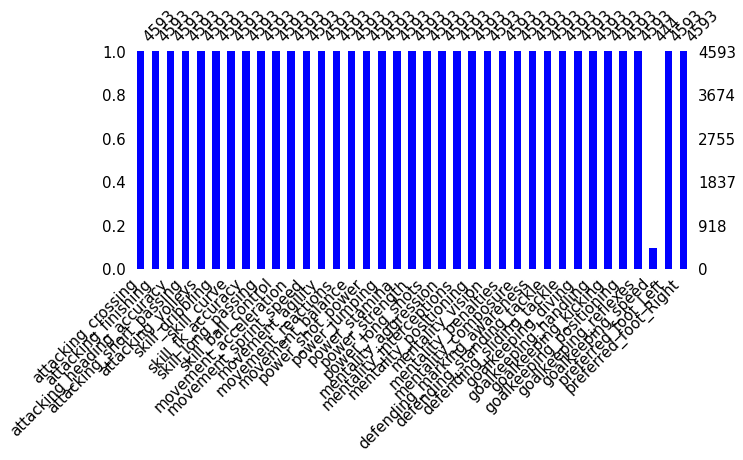

In [ ]:
import missingno as msno
msno.bar(df_final,figsize=(10, 4), fontsize=15, color ='blue')

Observamos que que variables pace, shooting, passing ,dribbling, defending, physic tienen pocos valores faltantes. Mienstras que la variable goalkeeping_speed tiene mayor cantidad.

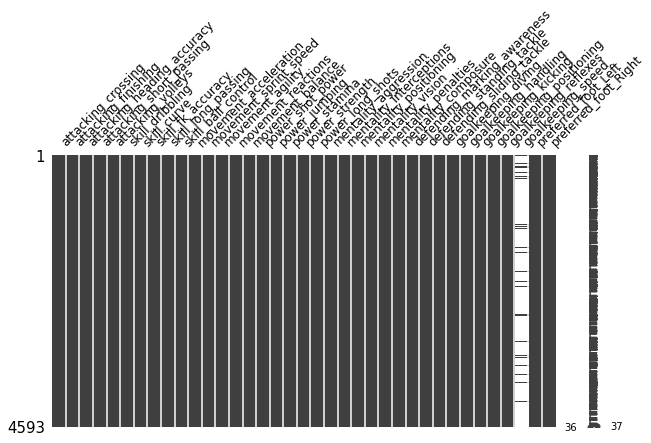

In [ ]:
#Matriz de posiciones de datos faltantes
msno.matrix(df_final, figsize=(10, 5), fontsize=12)

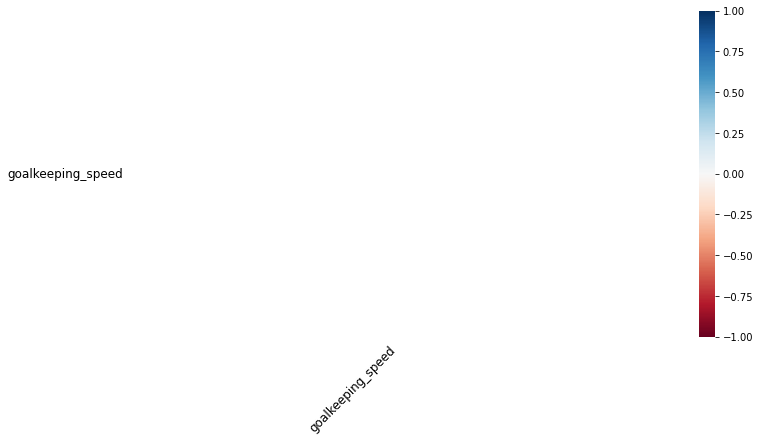

In [ ]:
msno.heatmap(df_final,figsize=(12, 6), fontsize=12)

Las variables pace, shooting, passing ,dribbling, defending, physic tienen una correlación positiva exacta. Mientras que la variable goalkeeping_speed tiene una correlación negativa con respecto al resto de las variables.

La variable goalkeeping speed es nula para todos los jugadores que no son arqueros. Por lo tanto, podríamos remplazar el valor por 0.

In [ ]:
df_best[~df_best.goalkeeping_speed.isna()].groupby('player_positions').sum()['goalkeeping_speed']

player_positions
GK    19447.0
Name: goalkeeping_speed, dtype: float64

In [ ]:
df_final['goalkeeping_speed'] = df['goalkeeping_speed'].fillna(0)

En el caso de las otras variables, notamos que esta siempre es nula cuando el jugador es arquero. 

In [ ]:
df_best[df_best.pace.isna()].groupby('player_positions').sum()['goalkeeping_speed']

player_positions
GK    19447.0
Name: goalkeeping_speed, dtype: float64

A estas instancias entonces también las vamos a imputar con el valor cero.

In [ ]:
df_final[['pace','shooting','passing','dribbling','defending','physic']] = df[['pace','shooting','passing','dribbling','defending','physic']].fillna(0)

In [ ]:
df_final.isnull().sum()

attacking_crossing             0
attacking_finishing            0
attacking_heading_accuracy     0
attacking_short_passing        0
attacking_volleys              0
skill_dribbling                0
skill_curve                    0
skill_fk_accuracy              0
skill_long_passing             0
skill_ball_control             0
movement_acceleration          0
movement_sprint_speed          0
movement_agility               0
movement_reactions             0
movement_balance               0
power_shot_power               0
power_jumping                  0
power_stamina                  0
power_strength                 0
power_long_shots               0
mentality_aggression           0
mentality_interceptions        0
mentality_positioning          0
mentality_vision               0
mentality_penalties            0
mentality_composure            0
defending_marking_awareness    0
defending_standing_tackle      0
defending_sliding_tackle       0
goalkeeping_diving             0
goalkeepin

## Clustering

In [ ]:
#en este df vamos a ir guardando los clusters que encuentre cada método
df_clusters=df_final.copy()

In [ ]:
#le agregamos una columna que indique la posición del jugador y otra con su nombre, lo vamos a usar para comparar
df_clusters['positions'] = df_positions['new_position']
df_clusters['player_name'] = df_best['short_name']

### K-Means Algorithm

Teniendo en cuenta que los jugadores pueden tener 4 posiciones (arquero, defensor, central y delantero), comenzamos eligiendo 4 como la cantidad de clusters que queremos encontrar.  

In [ ]:
# Número de clusters buscado
n_clust = 4 #Definimos la cantidad de cluster, grupos

km = KMeans(n_clusters=n_clust)
km.fit(df_final) #utiliza todas las habilidades: 34 dimensiones. Acá va encontrando clusters.

# Etiquetas asignadas por el algoritmo
clusters = km.labels_

In [ ]:
print('Kmeans encontró: ', max(km.labels_)+1, 'clusters')
print('Suma de los cuadrados de las distancias al centro de cada cluster=Inertia= ', km.inertia_)

Kmeans encontró:  4 clusters
Suma de los cuadrados de las distancias al centro de cada cluster=Inertia=  12936210.255161887


In [ ]:
df_clusters['kmeans_4'] = km.labels_ #clusters
df_clusters[['player_name','positions','kmeans_4']][:5]

,player_name,positions,kmeans_4
0,L. Messi,forward,2
1,R. Lewandowski,forward,2
2,Cristiano Ronaldo,forward,2
3,Neymar Jr,forward,2
4,K. De Bruyne,midfielder,0


Graficamos el resultado de agrupar a los jugadores usando kmedias con la cantidad de clases elegida: Visualizamos de a dos variables por vez

In [ ]:
# visualizamos 
sns.pairplot(df_clusters,
              x_vars=['shooting', 'attacking_finishing', 'defending_marking_awareness',
                        'defending_standing_tackle', 'goalkeeping_handling', 'goalkeeping_kicking',
                        'mentality_aggression', 'power_strength', 'skill_long_passing'],
              y_vars=['shooting', 'attacking_finishing', 'defending_marking_awareness',
                        'defending_standing_tackle', 'goalkeeping_handling', 'goalkeeping_kicking',
                        'mentality_aggression', 'power_strength', 'skill_long_passing'],
              hue = 'kmeans_4')

Output hidden; open in https://colab.research.google.com to view.

Vamos a ver ahora que pasa si nos guiamos por el método del codo para elegir la cantidad de clusters:

Text(0.5, 1.0, 'Inertia of k-Means versus number of clusters')

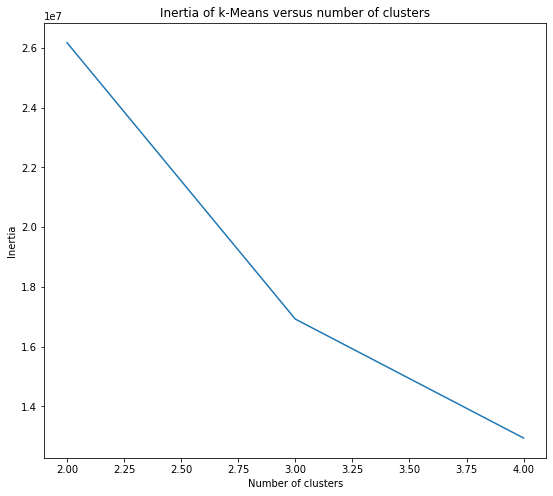

In [ ]:
scores = [KMeans(n_clusters=i).fit(df_final).inertia_ for i in range(2,5)]

plt.figure(figsize=(9,8))
plt.plot(np.arange(2, 5), scores)
plt.xlabel('Number of clusters')
plt.ylabel("Inertia")
plt.title("Inertia of k-Means versus number of clusters")

La cantidad óptima de clusters es 3. Volvemos a aplicar el modelo:

In [ ]:
# Número de clusters buscado
n_clust = 3 #Definimos la cantidad de cluster, grupos

km = KMeans(n_clusters=n_clust)
km.fit(df_final) #utiliza todas las habilidades: 34 dimensiones. Acá va encontrando clusters.

# Etiquetas asignadas por el algoritmo
clusters = km.labels_

In [ ]:
df_clusters['kmeans_3'] = km.labels_ #clusters
print('Kmeans encontró: ', max(km.labels_)+1, 'clusters')
print('Suma de los cuadrados de las distancias al centro de cada cluster=Inertia= ', km.inertia_)

Kmeans encontró:  3 clusters
Suma de los cuadrados de las distancias al centro de cada cluster=Inertia=  16919410.354493797


In [ ]:
# visualizamos 
sns.pairplot(df_clusters,
              x_vars=['shooting', 'attacking_finishing', 'defending_marking_awareness',
                        'defending_standing_tackle', 'goalkeeping_handling', 'goalkeeping_kicking',
                        'mentality_aggression', 'power_strength', 'skill_long_passing'],
              y_vars=['shooting', 'attacking_finishing', 'defending_marking_awareness',
                        'defending_standing_tackle', 'goalkeeping_handling', 'goalkeeping_kicking',
                        'mentality_aggression', 'power_strength', 'skill_long_passing'],
              hue = 'kmeans_3')

Output hidden; open in https://colab.research.google.com to view.

Veamos en un gráfico como cambian los clusters encontrados si comparamos los dos modelos anteriores y la determinación por posición.

In [ ]:
#funcion que devuelve pairplots
def pairplot(x,y,hue_var):
  sns.set(style="ticks")
  return sns.pairplot(df_clusters, x_vars = x, y_vars = y, hue = hue_var)

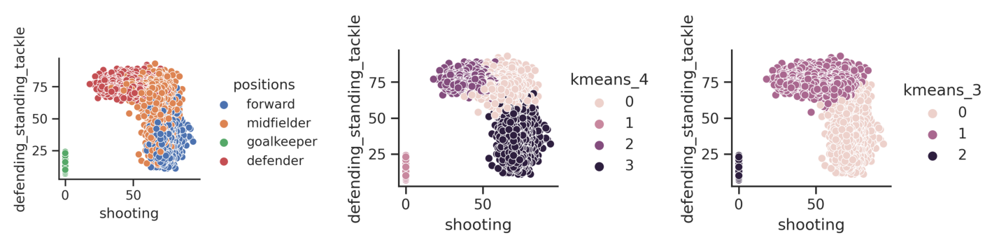

In [ ]:
import matplotlib.image as mpimg

skill_1 = 'shooting'
skill_2 = 'defending_standing_tackle'

#Aplicamos la función a diferentes hues
g0 = pairplot(skill_1, skill_2, 'positions');
g1 = pairplot(skill_1, skill_2, 'kmeans_4');
g2 = pairplot(skill_1, skill_2, 'kmeans_3');

#Lo guardamos como imagenes
g0.savefig('g0.png', dpi=300)
plt.close(g0.fig)

g1.savefig('g1.png', dpi=300)
plt.close(g1.fig)

g2.savefig('g2.png', dpi=300)
plt.close(g2.fig)

#Armamos una figure con las imagenes

f, axarr = plt.subplots(1, 3, figsize=(20, 20))

axarr[0].imshow(mpimg.imread('g0.png'))
axarr[1].imshow(mpimg.imread('g1.png'))
axarr[2].imshow(mpimg.imread('g2.png'))

# turn off x and y axis
[ax.set_axis_off() for ax in axarr.ravel()]

plt.tight_layout()
plt.show()


Notamos así que:
- todos separan a los arqueros como un grupo separado
- kmeans_4 parecería crear un cluster que parecería estar formado en su mayoría por defensores. Mezcla levemente a los mediocampistas y los delanteros. 
- Kmeans_3 separa a los defensores y los delanteros en dos grupos separados. Divide a los medio campistas (algunos van a un grupo y otros a otro).


### Mean Shift Algorithm

Este algoritmo nos permite encontrar clusters basandonos en centroides que se actualizan iterativamente hasta converger. 

In [ ]:
#Corremos el algoritmo con los parametros por defecto
from sklearn.cluster import MeanShift
ms = MeanShift()

ms.fit(df_final)

clusters_ms = ms.labels_
cluster_centers_ms = ms.cluster_centers_

labels_unique = np.unique(clusters_ms)
n_clusters_ = len(labels_unique)

print("Cantidad de clusters encontrados por Mean Shift : %d" % n_clusters_)

Cantidad de clusters encontrados por Mean Shift : 2


In [ ]:
#Guardamos el resultado para comprar con el algoritmo anterior
df_clusters['MeanShift'] = ms.labels_ 
df_clusters[:3]

,attacking_crossing,attacking_finishing,attacking_heading_accuracy,attacking_short_passing,attacking_volleys,skill_dribbling,skill_curve,skill_fk_accuracy,skill_long_passing,skill_ball_control,movement_acceleration,movement_sprint_speed,movement_agility,movement_reactions,movement_balance,power_shot_power,power_jumping,power_stamina,power_strength,power_long_shots,mentality_aggression,mentality_interceptions,mentality_positioning,mentality_vision,mentality_penalties,mentality_composure,defending_marking_awareness,defending_standing_tackle,defending_sliding_tackle,goalkeeping_diving,goalkeeping_handling,goalkeeping_kicking,goalkeeping_positioning,goalkeeping_reflexes,goalkeeping_speed,preferred_foot_Left,preferred_foot_Right,pace,shooting,passing,dribbling,defending,physic,positions,player_name,kmeans_4,kmeans_3,MeanShift
0,85,95,70,91,88,96,93,94,91,96,91,80,91,94,95,86,68,72,69,94,44,40,93,95,75,96,20,35,24,6,11,15,14,8,0.0,1,0,85.0,92.0,91.0,95.0,34.0,65.0,forward,L. Messi,3,0,0
1,71,95,90,85,89,85,79,85,70,88,77,79,77,93,82,90,85,76,86,87,81,49,95,81,90,88,35,42,19,15,6,12,8,10,0.0,0,1,78.0,92.0,79.0,86.0,44.0,82.0,forward,R. Lewandowski,3,0,0
2,87,95,90,80,86,88,81,84,77,88,85,88,86,94,74,94,95,77,77,93,63,29,95,76,88,95,24,32,24,7,11,15,14,11,0.0,0,1,87.0,94.0,80.0,88.0,34.0,75.0,forward,Cristiano Ronaldo,3,0,0


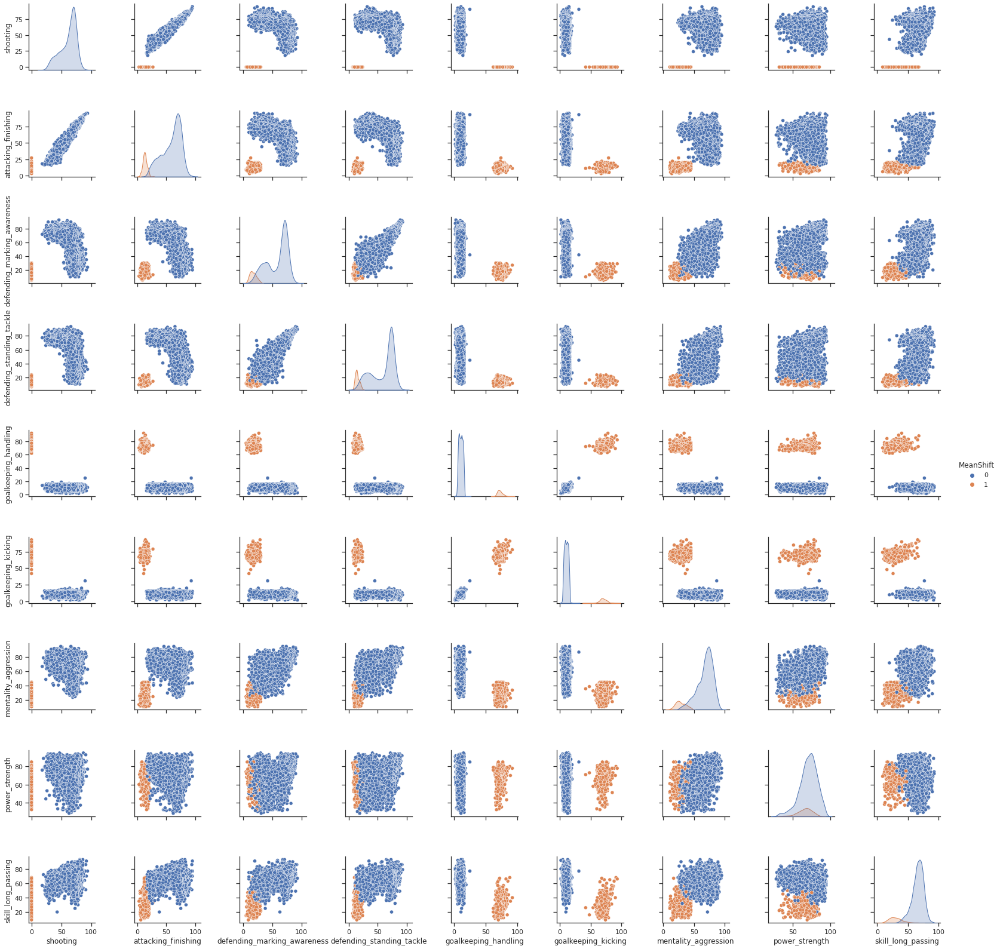

In [ ]:
# visualizamos 
sns.pairplot(df_clusters,
              x_vars=['shooting', 'attacking_finishing', 'defending_marking_awareness',
                        'defending_standing_tackle', 'goalkeeping_handling', 'goalkeeping_kicking',
                        'mentality_aggression', 'power_strength', 'skill_long_passing'],
              y_vars=['shooting', 'attacking_finishing', 'defending_marking_awareness',
                        'defending_standing_tackle', 'goalkeeping_handling', 'goalkeeping_kicking',
                        'mentality_aggression', 'power_strength', 'skill_long_passing'],
              hue = 'MeanShift')

Este modelo, con los hiperparametros por defecto, solo identifica un cluster de arqueros y otro de jugadores no arqueros.

Ajustamos los hiperparametros del algoritmo:

- bandwidth: refiere al ancho de banda a utilizar. Default = None. Si no se indica nada, el algoritmo usa el método sklearn.cluster.estimate_bandwidth para estimar un ancho de banda adecuado. Vamos a probar diferentes valores.

- cluster_all: bool, default=True. Si es true, todos los puntos se asignan a algun cluster, inclusive los "huerfanos" que no convergen a ningun centroide. En cambio, si lo dejamos en False, los puntos huerfanos se asignan a un clustes que se referencia con la etiqueta -1. Lo dejamos en True. 

- max_iter: int, default=300 Numero máximo de iteracciones por instancia.


El modelo anterior utilizó la siguiente función para definir el ancho de banda:

In [ ]:
from sklearn.cluster import estimate_bandwidth

band = estimate_bandwidth(df_final,random_state=0)

In [ ]:
#el ancho de banda utilizado es:
band

106.4261912169727

Vamos a probar ahora con otras opciones

In [ ]:
#Corremos el algoritmo con otros anchos de banda

#ms_30 = MeanShift(bandwidth = 30, max_iter=200)
ms_50 = MeanShift(bandwidth = 50, max_iter=200)
ms_70 = MeanShift(bandwidth = 70, max_iter=200)
ms_130 = MeanShift(bandwidth = 130, max_iter=200)

#ms_30.fit(df_final)
#clusters_ms_30 = ms_30.labels_
#labels_unique_30 = np.unique(clusters_ms_30)
#n_clusters_30 = len(labels_unique_30)
#print("Cantidad de clusters encontrados con Bandwidth 30 : %d" % n_clusters_30)

ms_50.fit(df_final)
clusters_ms_50 = ms_50.labels_
labels_unique_50 = np.unique(clusters_ms_50)
n_clusters_50 = len(labels_unique_50)
print("Cantidad de clusters encontrados con Bandwidth 50 : %d" % n_clusters_50)

ms_70.fit(df_final)
clusters_ms_70 = ms_70.labels_
labels_unique_70 = np.unique(clusters_ms_70)
n_clusters_70 = len(labels_unique_70)
print("Cantidad de clusters encontrados con Bandwidth 70 : %d" % n_clusters_70)

ms_130.fit(df_final)
clusters_ms_130 = ms_130.labels_
labels_unique_130 = np.unique(clusters_ms_130)
n_clusters_130 = len(labels_unique_130)
print("Cantidad de clusters encontrados con Bandwidth 130 : %d" % n_clusters_130)


Cantidad de clusters encontrados con Bandwidth 50 : 63
Cantidad de clusters encontrados con Bandwidth 70 : 3
Cantidad de clusters encontrados con Bandwidth 130 : 2


Evidentemente, las opciones de bandwidth 30 y 50 no tienen sentido. Ya que encuentran demasiados clusters, lo cual no nos sirve. La opción bandwidth 130 separa igual que el valor por defecto. 

In [ ]:
df_clusters['MeanShift_70'] = clusters_ms_70
df_clusters[:3]

,attacking_crossing,attacking_finishing,attacking_heading_accuracy,attacking_short_passing,attacking_volleys,skill_dribbling,skill_curve,skill_fk_accuracy,skill_long_passing,skill_ball_control,movement_acceleration,movement_sprint_speed,movement_agility,movement_reactions,movement_balance,power_shot_power,power_jumping,power_stamina,power_strength,power_long_shots,mentality_aggression,mentality_interceptions,mentality_positioning,mentality_vision,mentality_penalties,mentality_composure,defending_marking_awareness,defending_standing_tackle,defending_sliding_tackle,goalkeeping_diving,goalkeeping_handling,goalkeeping_kicking,goalkeeping_positioning,goalkeeping_reflexes,goalkeeping_speed,preferred_foot_Left,preferred_foot_Right,pace,shooting,passing,dribbling,defending,physic,positions,player_name,kmeans_4,kmeans_3,MeanShift,MeanShift_70
0,85,95,70,91,88,96,93,94,91,96,91,80,91,94,95,86,68,72,69,94,44,40,93,95,75,96,20,35,24,6,11,15,14,8,0.0,1,0,85.0,92.0,91.0,95.0,34.0,65.0,forward,L. Messi,3,0,0,0
1,71,95,90,85,89,85,79,85,70,88,77,79,77,93,82,90,85,76,86,87,81,49,95,81,90,88,35,42,19,15,6,12,8,10,0.0,0,1,78.0,92.0,79.0,86.0,44.0,82.0,forward,R. Lewandowski,3,0,0,0
2,87,95,90,80,86,88,81,84,77,88,85,88,86,94,74,94,95,77,77,93,63,29,95,76,88,95,24,32,24,7,11,15,14,11,0.0,0,1,87.0,94.0,80.0,88.0,34.0,75.0,forward,Cristiano Ronaldo,3,0,0,0


In [ ]:
#Sin embargo, notamos que el cluster 2 está formado por un unico jugador
df_clusters[df_clusters['MeanShift_70'] == 2]

,attacking_crossing,attacking_finishing,attacking_heading_accuracy,attacking_short_passing,attacking_volleys,skill_dribbling,skill_curve,skill_fk_accuracy,skill_long_passing,skill_ball_control,movement_acceleration,movement_sprint_speed,movement_agility,movement_reactions,movement_balance,power_shot_power,power_jumping,power_stamina,power_strength,power_long_shots,mentality_aggression,mentality_interceptions,mentality_positioning,mentality_vision,mentality_penalties,mentality_composure,defending_marking_awareness,defending_standing_tackle,defending_sliding_tackle,goalkeeping_diving,goalkeeping_handling,goalkeeping_kicking,goalkeeping_positioning,goalkeeping_reflexes,goalkeeping_speed,preferred_foot_Left,preferred_foot_Right,pace,shooting,passing,dribbling,defending,physic,positions,player_name,kmeans_4,kmeans_3,MeanShift,MeanShift_70
1970,11,7,12,14,14,8,69,74,18,23,40,37,45,64,51,53,69,28,60,8,31,22,16,55,22,61,27,9,9,71,73,71,75,76,39.0,0,1,0.0,0.0,0.0,0.0,0.0,0.0,goalkeeper,S. Viera,1,2,1,2


Vamos a tratar ahora sacando a los arqueros y aplicando el algoritmo solo sobre los jugadores que no son arqueros. 

In [ ]:
df_no_gk = df_best[df_best["player_positions"]!='GK']
df_clust_no_gk = df_no_gk[numerical_cols]
df_clust_no_gk['goalkeeping_speed'].fillna(0, inplace=True)

In [ ]:
#Corremos el algoritmo con los parametros por defecto
from sklearn.cluster import MeanShift
ms = MeanShift(bin_seeding=True)

ms.fit(df_clust_no_gk)

clusters_ms = ms.labels_
cluster_centers_ms = ms.cluster_centers_

labels_unique = np.unique(clusters_ms)
n_clusters_ = len(labels_unique)

print("Cantidad de clusters encontrados por Mean Shift : %d" % n_clusters_)

Cantidad de clusters encontrados por Mean Shift : 1


In [ ]:
#Ahora el ancho de banda es:
estimate_bandwidth(df_clust_no_gk, random_state=0)

77.88875068356654

In [ ]:
ms_bw = MeanShift(bandwidth = 62, max_iter=200)

ms_bw.fit(df_clust_no_gk)
clusters_ms_bw = ms_bw.labels_
labels_unique_bw = np.unique(clusters_ms_bw)
n_clusters_bw = len(labels_unique_bw)
print("Cantidad de clusters encontrados con otro Bandwidth : %d" % n_clusters_bw)

Cantidad de clusters encontrados con otro Bandwidth : 2


In [ ]:
df_clust_no_gk['MeanShift_bw'] = clusters_ms_bw
df_clust_no_gk[:3]

,attacking_crossing,attacking_finishing,attacking_heading_accuracy,attacking_short_passing,attacking_volleys,skill_dribbling,skill_curve,skill_fk_accuracy,skill_long_passing,skill_ball_control,movement_acceleration,movement_sprint_speed,movement_agility,movement_reactions,movement_balance,power_shot_power,power_jumping,power_stamina,power_strength,power_long_shots,mentality_aggression,mentality_interceptions,mentality_positioning,mentality_vision,mentality_penalties,mentality_composure,defending_marking_awareness,defending_standing_tackle,defending_sliding_tackle,goalkeeping_diving,goalkeeping_handling,goalkeeping_kicking,goalkeeping_positioning,goalkeeping_reflexes,goalkeeping_speed,MeanShift_bw
0,85,95,70,91,88,96,93,94,91,96,91,80,91,94,95,86,68,72,69,94,44,40,93,95,75,96,20,35,24,6,11,15,14,8,0.0,1
1,71,95,90,85,89,85,79,85,70,88,77,79,77,93,82,90,85,76,86,87,81,49,95,81,90,88,35,42,19,15,6,12,8,10,0.0,1
2,87,95,90,80,86,88,81,84,77,88,85,88,86,94,74,94,95,77,77,93,63,29,95,76,88,95,24,32,24,7,11,15,14,11,0.0,1


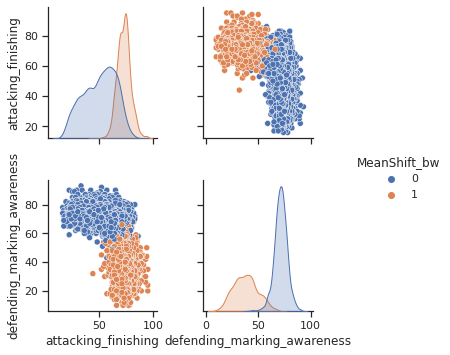

In [ ]:
# visualizamos 
sns.pairplot(df_clust_no_gk,
              x_vars=['attacking_finishing', 'defending_marking_awareness'],
              y_vars=['attacking_finishing', 'defending_marking_awareness'],
              hue = 'MeanShift_bw')

Comparamos ahora con lo anterior:

In [ ]:
skill_1 = 'shooting'
skill_2 = 'defending_standing_tackle'

#Aplicamos la función pariplot a diferentes hues
g3 = pairplot(skill_1, skill_2, 'MeanShift');

#Lo guardamos como imagen
g3.savefig('g3.png', dpi=300)
plt.close(g3.fig)


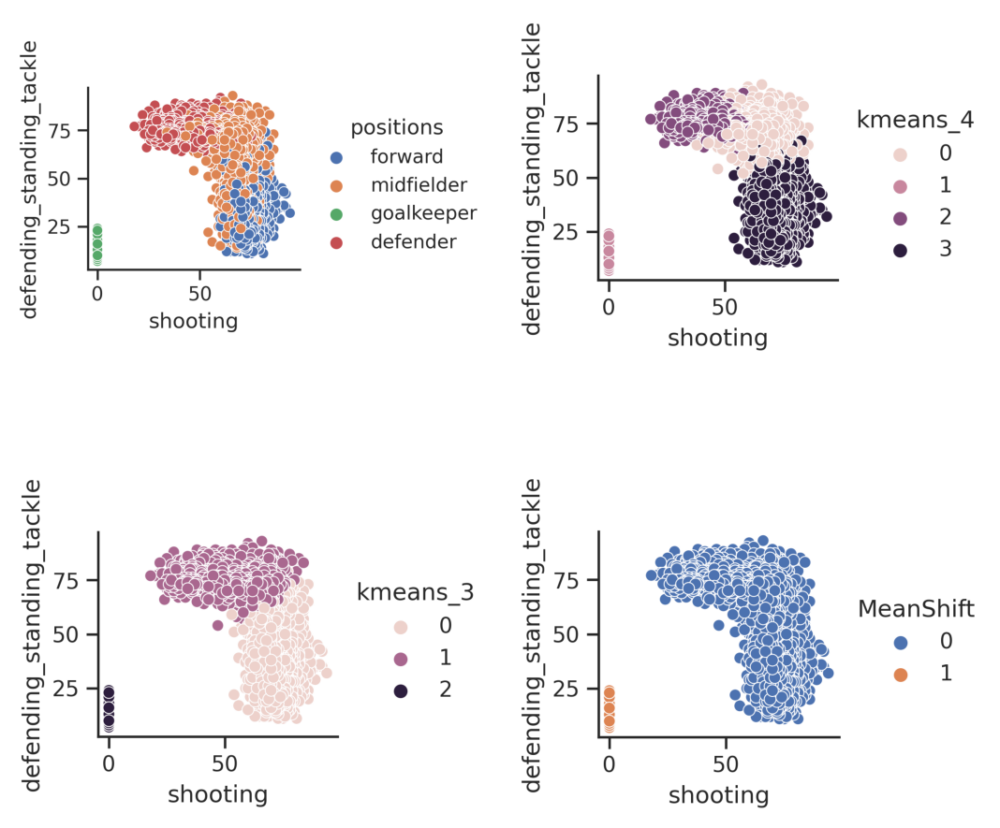

In [ ]:
#Armamos una figure con las imagenes

f, axarr = plt.subplots(2, 2, figsize=(15, 15))

axarr[0,0].imshow(mpimg.imread('g0.png'))
axarr[0,1].imshow(mpimg.imread('g1.png'))
axarr[1,0].imshow(mpimg.imread('g2.png'))
axarr[1,1].imshow(mpimg.imread('g3.png'))

# turn off x and y axis
[ax.set_axis_off() for ax in axarr.ravel()]

plt.tight_layout()
plt.show()

## Aplicación de PCA

Aplicamos ahora PCA sobre el df con las columnas que nos interesaban

In [ ]:
from sklearn.decomposition import PCA

pca = PCA(n_components=20)
pca.fit(df_final)
print("Principal components")
print(pca.components_)
print("Explained variance: ")
print(pca.explained_variance_)
print("Explained variance ratio")
print(pca.explained_variance_ratio_)

Principal components
[[-1.77989541e-01 -1.70252049e-01 -1.42202125e-01 -1.39075014e-01
  -1.57845917e-01 -1.90310861e-01 -1.75478280e-01 -1.53759796e-01
  -1.27362010e-01 -1.69624890e-01 -9.86660904e-02 -9.58432841e-02
  -9.96102267e-02 -1.16200201e-02 -9.58818227e-02 -7.05672256e-02
  -1.52788605e-02 -1.35836558e-01 -5.11576654e-03 -1.79692064e-01
  -1.23004365e-01 -1.24323922e-01 -1.90481147e-01 -8.53174898e-02
  -1.31879205e-01 -6.92093166e-02 -1.26882121e-01 -1.37964426e-01
  -1.27382061e-01  1.99684216e-01  1.91299280e-01  1.84218033e-01
   1.97212649e-01  2.04338637e-01  1.34274501e-01 -5.09995024e-04
   5.09995024e-04 -2.31427496e-01 -2.16849438e-01 -2.26910958e-01
  -2.37748898e-01 -1.81348896e-01 -2.16336004e-01]
 [-6.65104284e-02 -2.32054414e-01  1.09575267e-01  8.59230619e-03
  -2.00324678e-01 -9.62427903e-02 -1.35020868e-01 -1.29918540e-01
   4.14820179e-02 -4.11616255e-02 -1.00676653e-01 -7.31828892e-02
  -1.20307723e-01 -7.54122620e-03 -9.49436283e-02 -1.11618350e-01
   6

#### K-Means

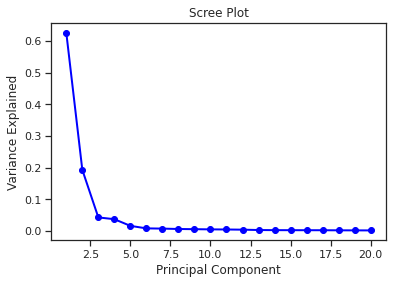

In [ ]:
PC_values = np.arange(pca.n_components_) + 1
plt.plot(PC_values, pca.explained_variance_ratio_, 'o-', linewidth=2, color='blue')
plt.title('Scree Plot')
plt.xlabel('Principal Component')
plt.ylabel('Variance Explained')
plt.show()

Las primeras 4 variables de PCA son las que mas explican. Nos quedamos solo con ellas

In [ ]:
x_reduced = pca.transform(df_final)

In [ ]:
x_reduced = x_reduced[:,:4] #pca0, pca1, pca2, pca3

In [ ]:
x_reduced

array([[ -95.28638216, -112.1034158 ,  -19.33287785,   18.65649498],
       [ -88.78838438,  -76.95734711,   27.74541446,   30.57287183],
       [ -87.06989579, -100.8774658 ,   22.14831885,   14.80726849],
       ...,
       [ -17.73711828,   27.08605299,  -18.94167023,  -33.77320913],
       [  -9.95520997,  -42.16974465,   32.37915735,  -10.08192345],
       [ -28.73565937,   19.69240196,    2.35030926,   19.85261051]])

In [ ]:
df_pca = pd.DataFrame(x_reduced,columns=['pca0', 'pca1','pca2', 'pca3'])
df_pca

,pca0,pca1,pca2,pca3
0,-95.286382,-112.103416,-19.332878,18.656495
1,-88.788384,-76.957347,27.745414,30.572872
2,-87.069896,-100.877466,22.148319,14.807268
3,-88.059834,-98.236417,-22.048484,3.169131
4,-107.861478,-36.298879,-32.365173,41.363498
...,...,...,...,...
4588,-10.614646,11.499529,-13.554725,13.500853
4589,-49.206119,17.337390,-5.942838,16.950662
4590,-17.737118,27.086053,-18.941670,-33.773209
4591,-9.955210,-42.169745,32.379157,-10.081923


Aplicamos el método del codo para elegir la cantidad de clusters

Text(0.5, 1.0, 'Inertia of k-Means versus number of clusters')

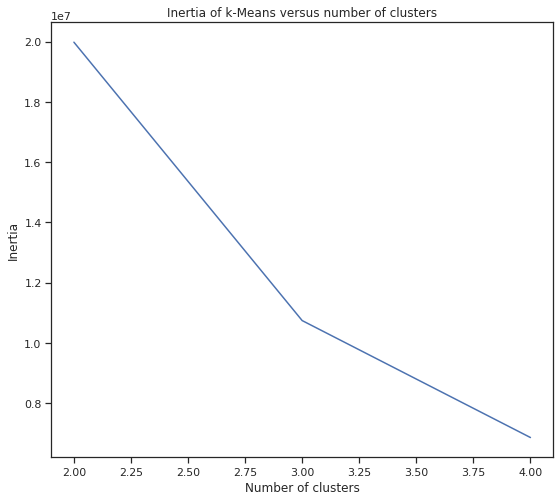

In [ ]:
scores = [KMeans(n_clusters=i).fit(df_pca).inertia_ for i in range(2,5)]

plt.figure(figsize=(9,8))
plt.plot(np.arange(2, 5), scores)
plt.xlabel('Number of clusters')
plt.ylabel("Inertia")
plt.title("Inertia of k-Means versus number of clusters")

In [ ]:
# Número de clusters elegido
n_clust = 3

km = KMeans(n_clusters=n_clust,random_state=4)
km.fit(df_pca) # Utiliza todas las variables

# Etiquetas asignadas por el algoritmo
clusters = km.labels_
print('Suma de los cuadrados de las distancias al centro de cada cluster=Inertia= ', km.inertia_)
print('Kmeans encontró: ', max(km.labels_)+1, 'clusters, nosotros forzamos la cantidad')

Suma de los cuadrados de las distancias al centro de cada cluster=Inertia=  10740535.98007642
Kmeans encontró:  3 clusters, nosotros forzamos la cantidad


In [ ]:
df_clusters_pca = df_pca.copy()

In [ ]:
df_clusters_pca['kmeans'] = km.labels_ #clusters
df_clusters.sample(5)

,attacking_crossing,attacking_finishing,attacking_heading_accuracy,attacking_short_passing,attacking_volleys,skill_dribbling,skill_curve,skill_fk_accuracy,skill_long_passing,skill_ball_control,movement_acceleration,movement_sprint_speed,movement_agility,movement_reactions,movement_balance,power_shot_power,power_jumping,power_stamina,power_strength,power_long_shots,mentality_aggression,mentality_interceptions,mentality_positioning,mentality_vision,mentality_penalties,mentality_composure,defending_marking_awareness,defending_standing_tackle,defending_sliding_tackle,goalkeeping_diving,goalkeeping_handling,goalkeeping_kicking,goalkeeping_positioning,goalkeeping_reflexes,goalkeeping_speed,preferred_foot_Left,preferred_foot_Right,pace,shooting,passing,dribbling,defending,physic,positions,player_name,kmeans_4,kmeans_3,MeanShift,MeanShift_70
3655,71,62,44,75,66,77,75,74,72,75,75,72,79,71,74,81,57,74,55,76,54,53,65,70,67,74,55,54,45,13,11,12,7,7,0.0,0,1,73.0,69.0,73.0,76.0,52.0,60.0,midfielder,Lucas Fernandes,3,0,0,0
1922,69,71,61,72,59,80,80,79,69,78,78,71,78,69,72,74,66,71,62,76,53,67,71,76,71,78,59,66,59,14,13,13,14,15,0.0,1,0,74.0,72.0,73.0,78.0,63.0,63.0,midfielder,R. Faivre,0,0,0,0
1409,74,65,45,77,63,78,77,40,75,78,79,78,84,70,86,70,60,66,55,66,63,50,75,83,50,66,50,47,40,9,7,13,15,8,0.0,1,0,78.0,66.0,75.0,78.0,48.0,60.0,midfielder,Melendo,3,0,0,0
1047,67,72,64,85,63,84,70,67,83,85,85,79,75,80,67,75,68,75,74,79,54,53,82,75,55,78,50,52,42,8,9,12,8,8,0.0,0,1,82.0,73.0,77.0,82.0,52.0,70.0,forward,Nuno Padrenda,3,0,0,0
3284,72,44,57,67,41,68,69,61,57,68,68,73,69,69,73,47,70,76,69,47,56,67,60,62,52,62,70,74,68,8,10,8,4,8,0.0,1,0,71.0,46.0,65.0,68.0,69.0,68.0,defender,C. Townsend,0,1,0,0


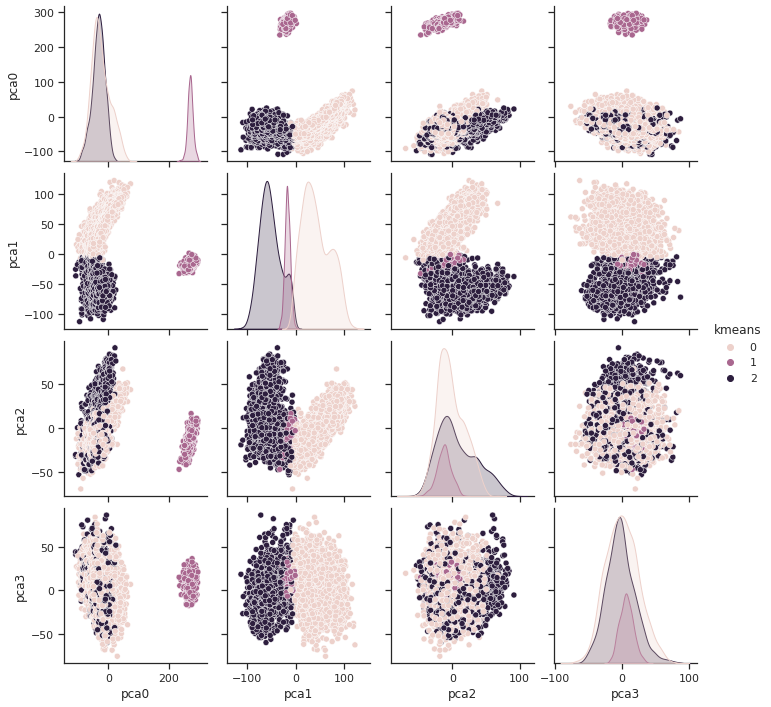

In [ ]:
# visualizamos con PCA
sns.pairplot(df_clusters_pca,
              x_vars=['pca0', 'pca1','pca2', 'pca3'],
              y_vars=['pca0', 'pca1','pca2', 'pca3'],
              hue = 'kmeans')

In [ ]:
df_clusters['kmeans_pca'] = km.labels_ #clusters
df_clusters.sample(5)

,attacking_crossing,attacking_finishing,attacking_heading_accuracy,attacking_short_passing,attacking_volleys,skill_dribbling,skill_curve,skill_fk_accuracy,skill_long_passing,skill_ball_control,movement_acceleration,movement_sprint_speed,movement_agility,movement_reactions,movement_balance,power_shot_power,power_jumping,power_stamina,power_strength,power_long_shots,mentality_aggression,mentality_interceptions,mentality_positioning,mentality_vision,mentality_penalties,mentality_composure,defending_marking_awareness,defending_standing_tackle,defending_sliding_tackle,goalkeeping_diving,goalkeeping_handling,goalkeeping_kicking,goalkeeping_positioning,goalkeeping_reflexes,goalkeeping_speed,preferred_foot_Left,preferred_foot_Right,pace,shooting,passing,dribbling,defending,physic,positions,player_name,kmeans_4,kmeans_3,MeanShift,MeanShift_70,kmeans_pca
1023,52,75,83,66,72,75,69,40,54,76,77,84,69,79,65,75,78,78,76,66,90,40,84,59,75,76,38,45,35,8,9,7,7,7,0.0,0,1,81.0,74.0,59.0,74.0,45.0,79.0,forward,Soares,3,0,0,0,2
2361,36,80,78,58,75,68,57,36,35,69,66,73,64,75,64,78,77,71,82,64,77,17,72,52,74,70,27,24,19,9,8,14,7,13,0.0,0,1,70.0,75.0,48.0,68.0,28.0,78.0,forward,G. Giakoumakis,3,0,0,0,2
3938,71,66,40,64,52,71,69,72,59,73,83,77,85,66,76,70,58,72,69,71,49,25,69,68,70,66,28,18,19,15,7,15,14,11,0.0,0,1,80.0,67.0,66.0,73.0,25.0,65.0,midfielder,Y. Ngbakoto,3,0,0,0,2
726,80,62,74,78,46,74,63,45,69,79,69,68,67,80,67,76,82,81,72,63,76,76,75,68,48,70,74,77,75,15,8,12,11,9,0.0,0,1,68.0,64.0,73.0,75.0,75.0,76.0,defender,M. Doherty,0,1,0,0,0
2893,71,65,72,79,62,75,45,48,45,71,78,81,71,71,82,63,54,57,62,64,49,22,77,68,72,72,35,12,11,8,9,15,16,8,0.0,0,1,80.0,65.0,67.0,73.0,27.0,58.0,forward,Fabri Arnoia,3,0,0,0,2


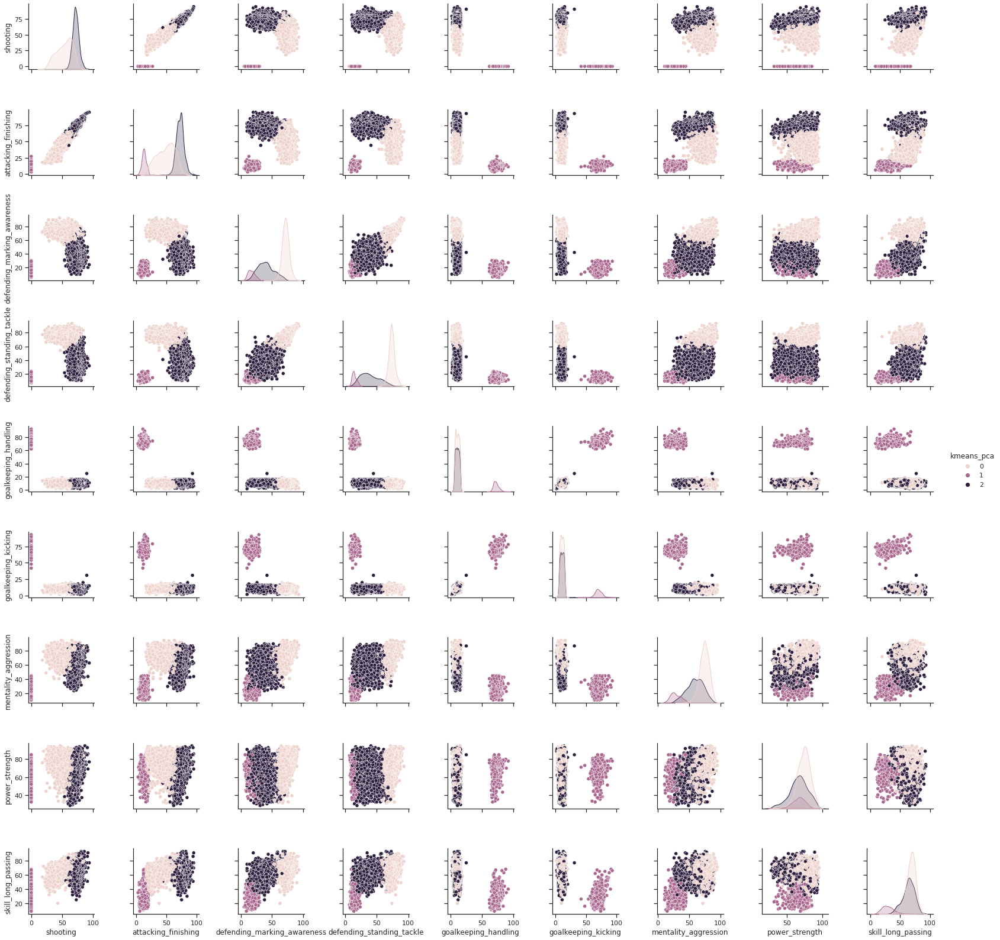

In [ ]:
# visualizamos con los skills
sns.pairplot(df_clusters,
              x_vars=['shooting', 'attacking_finishing', 'defending_marking_awareness',
                        'defending_standing_tackle', 'goalkeeping_handling', 'goalkeeping_kicking',
                        'mentality_aggression', 'power_strength', 'skill_long_passing'],
              y_vars=['shooting', 'attacking_finishing', 'defending_marking_awareness',
                        'defending_standing_tackle', 'goalkeeping_handling', 'goalkeeping_kicking',
                        'mentality_aggression', 'power_strength', 'skill_long_passing'],
              hue = 'kmeans_pca')

#### MeanShift

In [ ]:
#Corremos el algoritmo con los parametros por defecto
from sklearn.cluster import MeanShift
ms = MeanShift()

ms.fit(df_pca)

clusters_ms = ms.labels_
cluster_centers_ms = ms.cluster_centers_

labels_unique = np.unique(clusters_ms)
n_clusters_ = len(labels_unique)

print("Cantidad de clusters encontrados por Mean Shift : %d" % n_clusters_)

Cantidad de clusters encontrados por Mean Shift : 2


In [ ]:
df_clusters_pca['meanshift'] = ms.labels_ #clusters
df_clusters.sample(5)

,attacking_crossing,attacking_finishing,attacking_heading_accuracy,attacking_short_passing,attacking_volleys,skill_dribbling,skill_curve,skill_fk_accuracy,skill_long_passing,skill_ball_control,movement_acceleration,movement_sprint_speed,movement_agility,movement_reactions,movement_balance,power_shot_power,power_jumping,power_stamina,power_strength,power_long_shots,mentality_aggression,mentality_interceptions,mentality_positioning,mentality_vision,mentality_penalties,mentality_composure,defending_marking_awareness,defending_standing_tackle,defending_sliding_tackle,goalkeeping_diving,goalkeeping_handling,goalkeeping_kicking,goalkeeping_positioning,goalkeeping_reflexes,goalkeeping_speed,preferred_foot_Left,preferred_foot_Right,pace,shooting,passing,dribbling,defending,physic,positions,player_name,kmeans_4,kmeans_3,MeanShift,MeanShift_70,kmeans_pca
3476,62,54,75,70,50,65,57,40,65,63,71,70,73,70,65,56,73,70,75,44,66,75,69,67,75,70,70,72,70,10,15,15,14,10,0.0,0,1,70.0,54.0,65.0,66.0,72.0,72.0,defender,J. Báez,0,1,0,0,0
14,58,64,79,84,62,69,62,74,84,79,60,69,61,87,66,88,87,89,90,81,91,87,75,80,66,84,85,88,87,13,14,16,12,12,0.0,0,1,65.0,73.0,76.0,73.0,86.0,90.0,midfielder,Casemiro,0,1,0,0,0
3821,40,24,68,64,31,55,38,29,54,62,65,70,56,70,49,40,72,55,78,30,67,74,30,48,45,53,75,76,73,12,10,6,6,13,0.0,0,1,68.0,30.0,51.0,58.0,74.0,70.0,defender,M. Lovato,2,1,0,0,0
2955,38,42,73,59,36,46,36,27,61,61,54,54,60,69,52,52,78,67,76,34,87,73,28,39,32,66,76,74,75,11,7,13,14,6,0.0,0,1,54.0,41.0,48.0,54.0,74.0,76.0,defender,E. Cabaco,2,1,0,0,0
4298,73,48,70,62,43,48,44,63,60,75,62,76,63,65,72,62,62,79,65,59,75,57,55,48,70,62,68,68,77,10,10,12,11,11,0.0,0,1,70.0,54.0,60.0,60.0,67.0,70.0,defender,Edsinho Torres,0,1,0,0,0


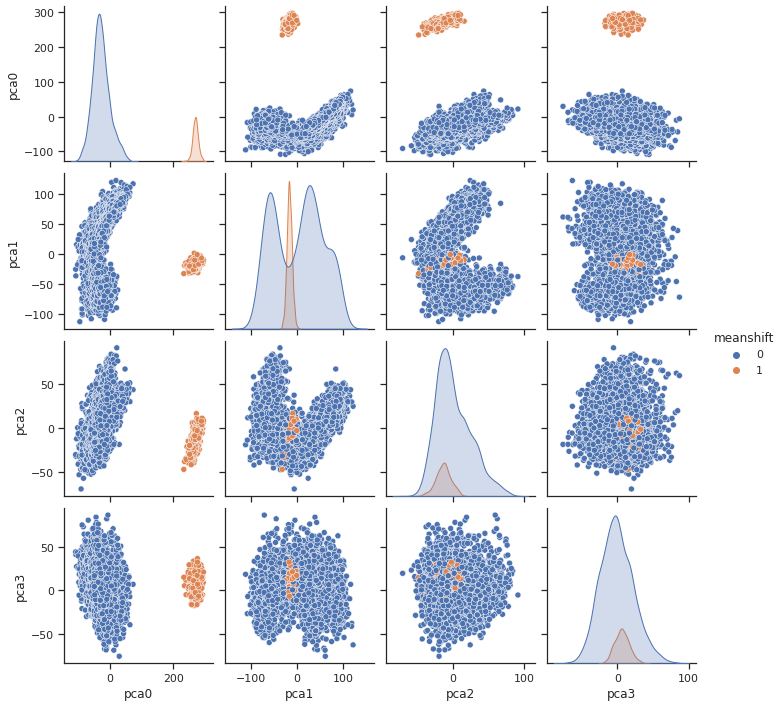

In [ ]:
# visualizamos con PCA
sns.pairplot(df_clusters_pca,
              x_vars=['pca0', 'pca1','pca2', 'pca3'],
              y_vars=['pca0', 'pca1','pca2', 'pca3'],
              hue = 'meanshift')

In [ ]:
#Guardamos el resultado para comprar con el algoritmo anterior
df_clusters['meanshift_pca'] = ms.labels_ 
df_clusters[:3]

,attacking_crossing,attacking_finishing,attacking_heading_accuracy,attacking_short_passing,attacking_volleys,skill_dribbling,skill_curve,skill_fk_accuracy,skill_long_passing,skill_ball_control,movement_acceleration,movement_sprint_speed,movement_agility,movement_reactions,movement_balance,power_shot_power,power_jumping,power_stamina,power_strength,power_long_shots,mentality_aggression,mentality_interceptions,mentality_positioning,mentality_vision,mentality_penalties,mentality_composure,defending_marking_awareness,defending_standing_tackle,defending_sliding_tackle,goalkeeping_diving,goalkeeping_handling,goalkeeping_kicking,goalkeeping_positioning,goalkeeping_reflexes,goalkeeping_speed,preferred_foot_Left,preferred_foot_Right,pace,shooting,passing,dribbling,defending,physic,positions,player_name,kmeans_4,kmeans_3,MeanShift,MeanShift_70,kmeans_pca,meanshift_pca
0,85,95,70,91,88,96,93,94,91,96,91,80,91,94,95,86,68,72,69,94,44,40,93,95,75,96,20,35,24,6,11,15,14,8,0.0,1,0,85.0,92.0,91.0,95.0,34.0,65.0,forward,L. Messi,3,0,0,0,2,0
1,71,95,90,85,89,85,79,85,70,88,77,79,77,93,82,90,85,76,86,87,81,49,95,81,90,88,35,42,19,15,6,12,8,10,0.0,0,1,78.0,92.0,79.0,86.0,44.0,82.0,forward,R. Lewandowski,3,0,0,0,2,0
2,87,95,90,80,86,88,81,84,77,88,85,88,86,94,74,94,95,77,77,93,63,29,95,76,88,95,24,32,24,7,11,15,14,11,0.0,0,1,87.0,94.0,80.0,88.0,34.0,75.0,forward,Cristiano Ronaldo,3,0,0,0,2,0


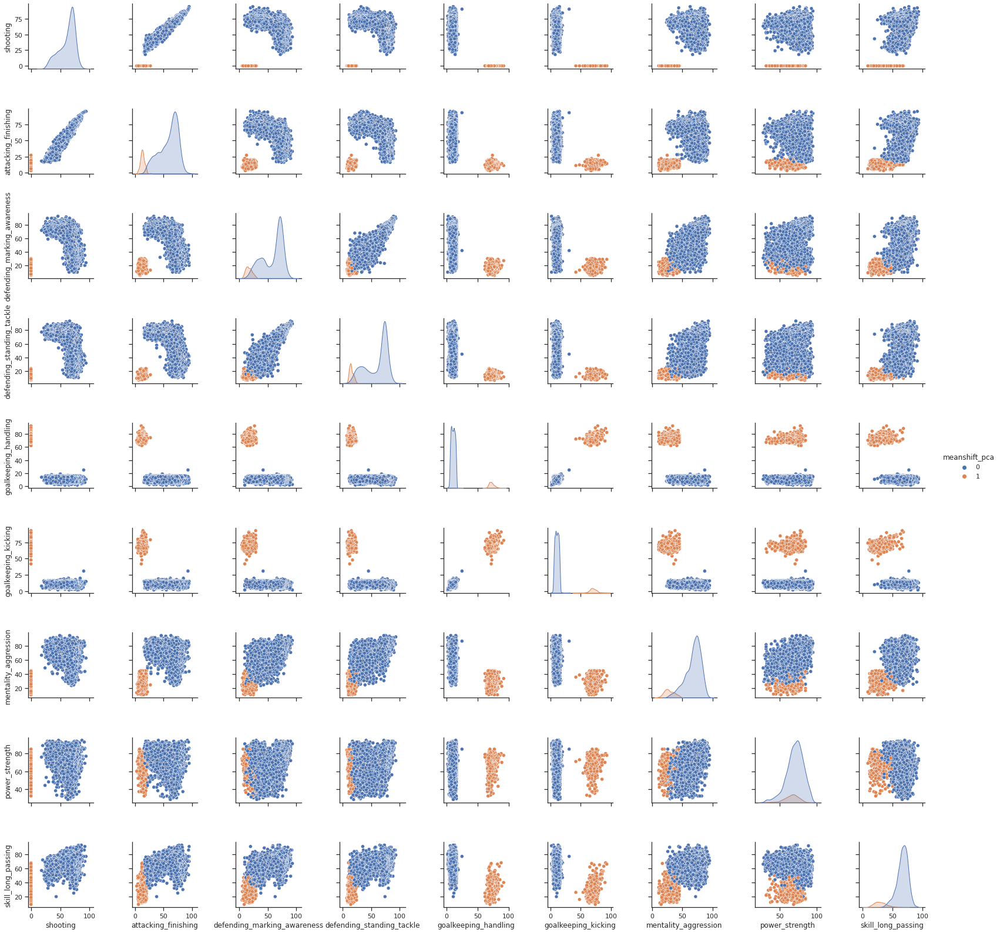

In [ ]:
# visualizamos con los skills originales
sns.pairplot(df_clusters,
              x_vars=['shooting', 'attacking_finishing', 'defending_marking_awareness',
                        'defending_standing_tackle', 'goalkeeping_handling', 'goalkeeping_kicking',
                        'mentality_aggression', 'power_strength', 'skill_long_passing'],
              y_vars=['shooting', 'attacking_finishing', 'defending_marking_awareness',
                        'defending_standing_tackle', 'goalkeeping_handling', 'goalkeeping_kicking',
                        'mentality_aggression', 'power_strength', 'skill_long_passing'],
              hue = 'meanshift_pca')

Comparamos todos los resultados:

In [ ]:
skill_1 = 'shooting'
skill_2 = 'defending_standing_tackle'

#Aplicamos la función pariplot a diferentes hues
g4 = pairplot(skill_1, skill_2, 'kmeans_pca');
g5 = pairplot(skill_1, skill_2, 'meanshift_pca');

#Lo guardamos como imagen
g4.savefig('g4.png', dpi=300)
plt.close(g4.fig)

g5.savefig('g5.png', dpi=300)
plt.close(g5.fig)

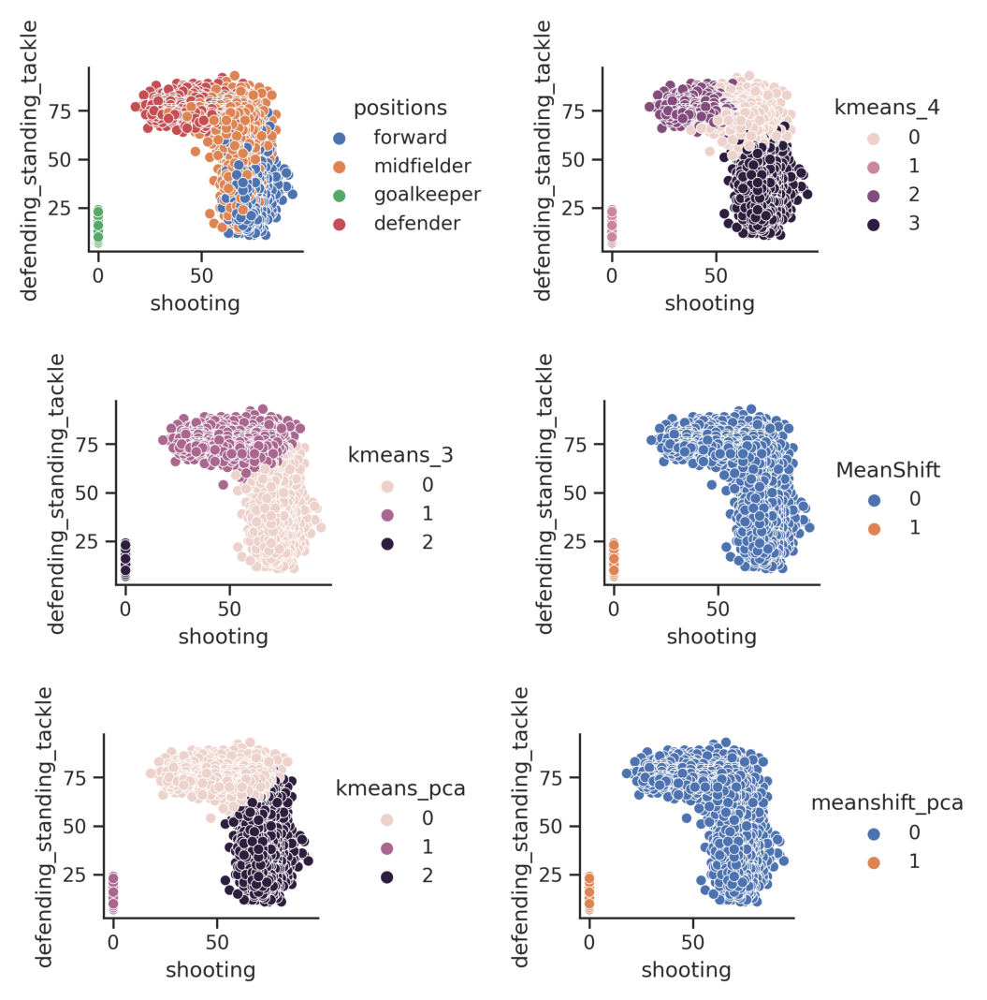

In [ ]:
#Armamos una figure con las imagenes

f, axarr = plt.subplots(3, 2, figsize=(15, 15))

axarr[0,0].imshow(mpimg.imread('g0.png'))
axarr[0,1].imshow(mpimg.imread('g1.png'))
axarr[1,0].imshow(mpimg.imread('g2.png'))
axarr[1,1].imshow(mpimg.imread('g3.png'))
axarr[2,0].imshow(mpimg.imread('g4.png'))
axarr[2,1].imshow(mpimg.imread('g5.png'))

# turn off x and y axis
[ax.set_axis_off() for ax in axarr.ravel()]

plt.tight_layout()
plt.show()

En función de esto podriamos decir que el modelo de Kmeans trabaja mejor en este dataset que el el de meanshift. 

## Evaluación y Análisis de los clusters encontrados.


#### Kmeans 4

Vamos a comenzar analizando los clusters encontrados por kmeans con n = 4

Para una mejor comprensión de los resultados, vamos a agrupar las skills por "tipo": en ataque, defensa, generales, movimiento, poder, mentales y de portería. Para ello, calculamos una columna que contiene la valuación promedio de cada jugador en esa categoría de habilidades.

In [ ]:
attack = ['attacking_crossing', 'attacking_finishing', 
               'attacking_heading_accuracy', 'attacking_short_passing',
               'attacking_volleys']
deffend = ['defending_marking_awareness', 'defending_standing_tackle',
                'defending_sliding_tackle']
general = ['skill_dribbling', 'skill_curve',
              'skill_fk_accuracy', 'skill_long_passing', 
              'skill_ball_control']
movement = ['movement_acceleration', 'movement_sprint_speed', 
                'movement_agility', 'movement_reactions', 'movement_balance']
power = ['power_shot_power', 'power_jumping', 'power_stamina', 
            'power_strength', 'power_long_shots']
mentality = ['mentality_aggression', 'mentality_interceptions',
                 'mentality_positioning', 'mentality_vision', 'mentality_penalties',
                 'mentality_composure']
goalkeeping = ['goalkeeping_diving', 'goalkeeping_handling', 
                   'goalkeeping_kicking','goalkeeping_positioning', 
                   'goalkeeping_reflexes', 'goalkeeping_speed']

In [ ]:
df_clusters['attack_avg'] = df_clusters[attack].mean(numeric_only=True, axis=1)
df_clusters['deffend_avg'] = df_clusters[deffend].mean(numeric_only=True, axis=1)
df_clusters['general_avg'] = df_clusters[general].mean(numeric_only=True, axis=1)
df_clusters['movement_avg'] = df_clusters[movement].mean(numeric_only=True, axis=1)
df_clusters['power_avg'] = df_clusters[power].mean(numeric_only=True, axis=1)
df_clusters['mentality_avg'] = df_clusters[mentality].mean(numeric_only=True, axis=1)
df_clusters['goalkeeping_avg'] = df_clusters[goalkeeping].mean(numeric_only=True, axis=1)

In [ ]:
avg_cols = ['attack_avg', 'deffend_avg','general_avg',
            'movement_avg','power_avg','mentality_avg',
            'goalkeeping_avg']

In [ ]:
df_clusters[avg_cols][:3]

,attack_avg,deffend_avg,general_avg,movement_avg,power_avg,mentality_avg,goalkeeping_avg
0,85.8,26.333333,94.0,90.2,77.8,73.833333,9.000000
1,86.0,32.000000,81.4,81.6,84.8,80.666667,8.500000
2,87.6,26.666667,83.6,85.4,87.2,74.333333,9.666667


Ahora, observamos los clusters en terminos de estas 7 categorías. 

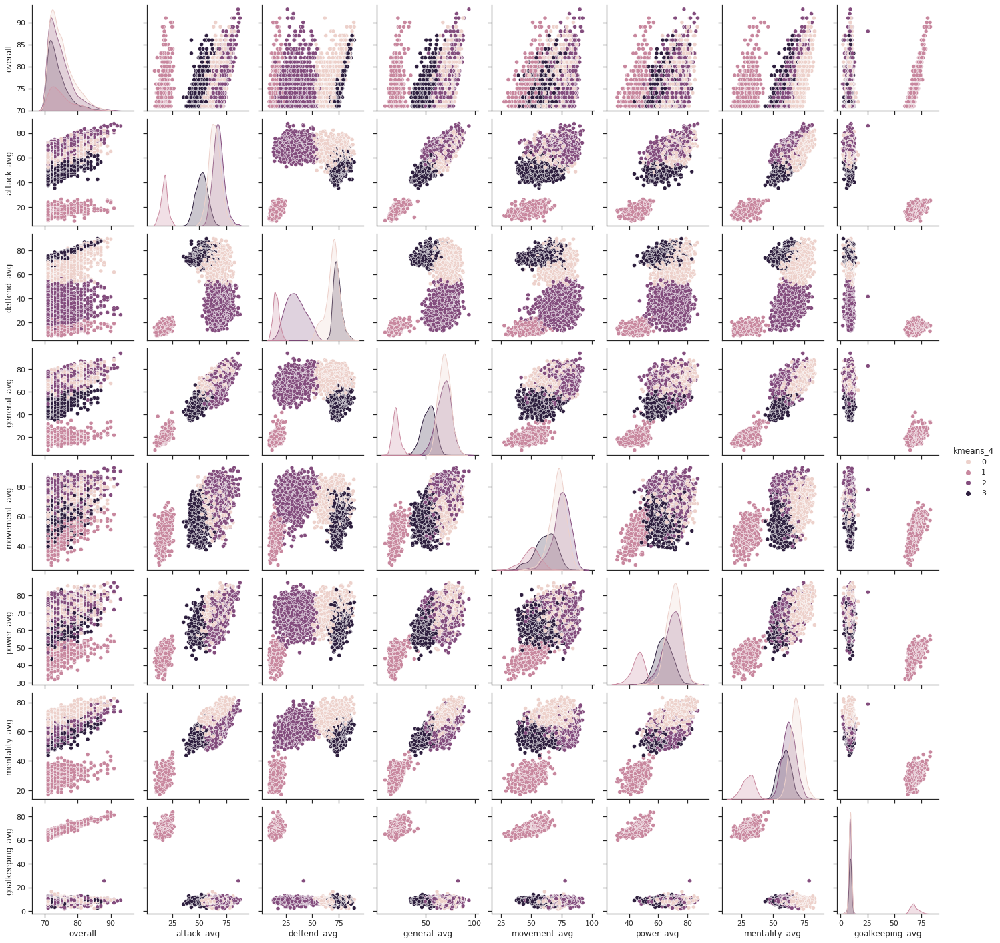

In [ ]:
# visualizamos:

sns.pairplot(df_clusters, x_vars=avg_cols, y_vars=avg_cols, hue = 'kmeans_4')

In [ ]:
df_clusters.groupby('kmeans_4')[avg_cols].describe()

overall                                                     \
           count       mean       std   min   25%   50%   75%   max   
kmeans_4                                                              
0         1726.0  75.086327  3.622805  71.0  72.0  74.0  77.0  91.0   
1          444.0  75.193694  4.020642  71.0  72.0  74.0  77.0  91.0   
2         1499.0  74.754503  3.692960  71.0  72.0  74.0  76.0  93.0   
3          924.0  73.928571  3.061537  71.0  72.0  73.0  75.0  87.0   

         attack_avg                                                     \
              count       mean       std   min   25%   50%   75%   max   
kmeans_4                                                                 
0            1726.0  64.085400  5.457220  48.4  60.4  63.8  67.6  82.4   
1             444.0  17.450000  3.195556   8.6  15.4  17.6  19.4  26.4   
2            1499.0  67.600400  5.085966  52.8  64.2  67.2  70.6  87.6   
3             924.0  51.942857  5.349127  35.4  48.2  52.0  55.6  67.8   

         deffend_avg                                                        \
               count       mean       std        min        25%        50%   
kmeans_4                                                                     
0             1726.0  69.325415  6.649689  50.333333  66.000000  70.000000   
1              444.0  15.421171  2.863248   9.000000  13.333333  15.333333   
2             1499.0  34.213476  9.135025  13.000000  27.333333  33.666667   
3              924.0  73.978355  4.022390  64.000000  71.000000  73.333333   

                               general_avg                                   \
                75%        max       count       mean       std   min   25%   
kmeans_4                                                                      
0         73.333333  90.000000      1726.0  69.024450  6.010008  53.6  64.8   
1         17.083333  24.333333       444.0  19.936036  4.188284   8.6  17.4   
2         40.666667  57.666667      1499.0  68.147432  7.390295  45.6  63.2   
3         76.000000  90.000000       924.0  52.564935  6.392356  34.6  48.0   

                            movement_avg                                   \
           50%    75%   max        count       mean       std   min   25%   
kmeans_4                                                                    
0         68.8  73.15  88.0       1726.0  71.776014  6.609460  43.8  68.0   
1         19.4  21.80  41.8        444.0  49.651802  7.200095  27.6  45.2   
2         68.6  73.40  94.0       1499.0  74.710740  7.494804  40.2  71.0   
3         53.0  57.20  70.2        924.0  61.598052  8.548633  37.8  56.0   

                           power_avg                                          \
           50%   75%   max     count       mean       std   min    25%   50%   
kmeans_4                                                                       
0         72.4  76.2  88.2    1726.0  70.672885  5.250523  48.8  67.20  71.0   
1         50.2  54.6  69.4     444.0  46.005856  4.341397  31.8  43.55  46.6   
2         75.4  79.8  92.4    1499.0  69.820680  6.169794  47.2  66.00  70.4   
3         62.4  68.2  80.2     924.0  63.950433  5.675655  43.6  60.00  63.8   

                     mentality_avg                                             \
           75%   max         count       mean       std        min        25%   
kmeans_4                                                                        
0         74.2  87.0        1726.0  68.310834  4.776245  53.666667  65.166667   
1         49.0  56.8         444.0  30.108108  4.920265  17.166667  26.666667   
2         74.4  87.2        1499.0  62.802535  5.333910  47.333333  59.166667   
3         67.8  83.2         924.0  58.852273  4.902299  43.666667  55.291667   

                                          goalkeeping_avg             \
                50%        75%        max           count       mean   
kmeans_4                                                               
0     

Podemos observar que los jugadores de cada cluster suelen tener una valoración promedio de habilidades muy parecidas en la categoría de **ataque**. Además, cluster 1 y 2 tienen promedio más alto en comparación con los otros dos clusters; en especial si se lo compara con el cluster n° 3.  

En cuanto a las habilidades de **defensa**, podemos observar los clusters 0 y 3 tienen las mejores puntuaciones; siendo, en promedio, mejor la valoración del cluster 3 que la del 0. 


En promedio, los clusters 0 y 2 tienen mejores valoraciones que los 1 y 3 en habilidades **generales** y de **movimiento**. En particular, el cluster 3 tiene un promedio muy bajo en la categoría general.

Por otro lado, en lo que respecta a las habilidades de **poder** y **mente**, la diferencia entre los clusters 0, 2 y 3 se achica; aunque 1 y 3 siguen encontrandose por debajo de 0 y 2.

Finalmente, en las habilidades de **goalkeeping**, el cluster 2 supera a los otros apliamente.

Así, cocluimos que: 

* **Cluster 0**: los jugadores de esta categoría tienen puntuación alta tanto en las habilidades de defensa como en las de ataque. Además, suelen tener una valoración promedio sobresaliente en las otras categorías (sin considerar goalkeeping). Podemos decir que son jugadores más flexibles; podrían ser tanto defensores como delanteros o mediocampistas.

* **Cluster 1**: los jugadores de esta categoría tienen puntuación baja (o al menos menor que los otros clusters) en casi todas las habilidades. Excepto en la habilidad de goalkeeping, donde tienen una puntuación muy alta. Podemos decir que son los mejores para ocupar posiciones de arquero. 

* **Cluster 2**: los jugadores de esta categoría tienen puntuación alta en las habilidades de ataque, pero muy baja en las de defensa. En las otras habilidades, también tienen buenos resultados; en promedio, se encuentran muy cerca de los jugadores del cluster 0. Podemos decir que tienen mejores aptitudes para jugar como delanteros o mediocampistas, y no serían tan buenos defensores.

* **Cluster 3**: los jugadores de esta categoría tienen puntuación alta  en las habilidades de defensa y menor en las de ataque. Su puntuación en las otras habilidades se encuentra, en promedio, por arriba del 50%. Sin embargo, sus resultados en estas otras habilidades es menor al de los clusters 0 y 2. Podemos decir que serían buenos defensores o mediocampistas traseros.  

Finalmente, comparando la categorización realizada por los el modelo de clusterización y la clasificación que surge de separar a los jugadores en sus posiciones, podemos afirmar que la separación no es exactamente la misma. Concluyendo que: 

* Cluster 0: contiene en su mayoría mediocampistas y defensores. 
* Cluster 1: contiene los arqueros
* Cluster 3: contiene en su mayoría delanteros y mediocampistas
* Cluster 2: contiene en su mayoría defensores y algunos mediocampistas.

Esto reafirmar las conclusiones que habíamos provisto en los items anteriores sobre cada cluster. 

In [ ]:
pd.crosstab(df_clusters.positions,df_clusters.kmeans_4)

kmeans_4,0,1,2,3
positions,,,,
defender,660,0,0,825
forward,31,0,860,0
goalkeeper,0,444,0,0
midfielder,1035,0,639,99


### Kmeans_3

Realizamos ahora el mismo analisis pero para el modelo de kmeans que tomaba 3 clusters unicamente. 

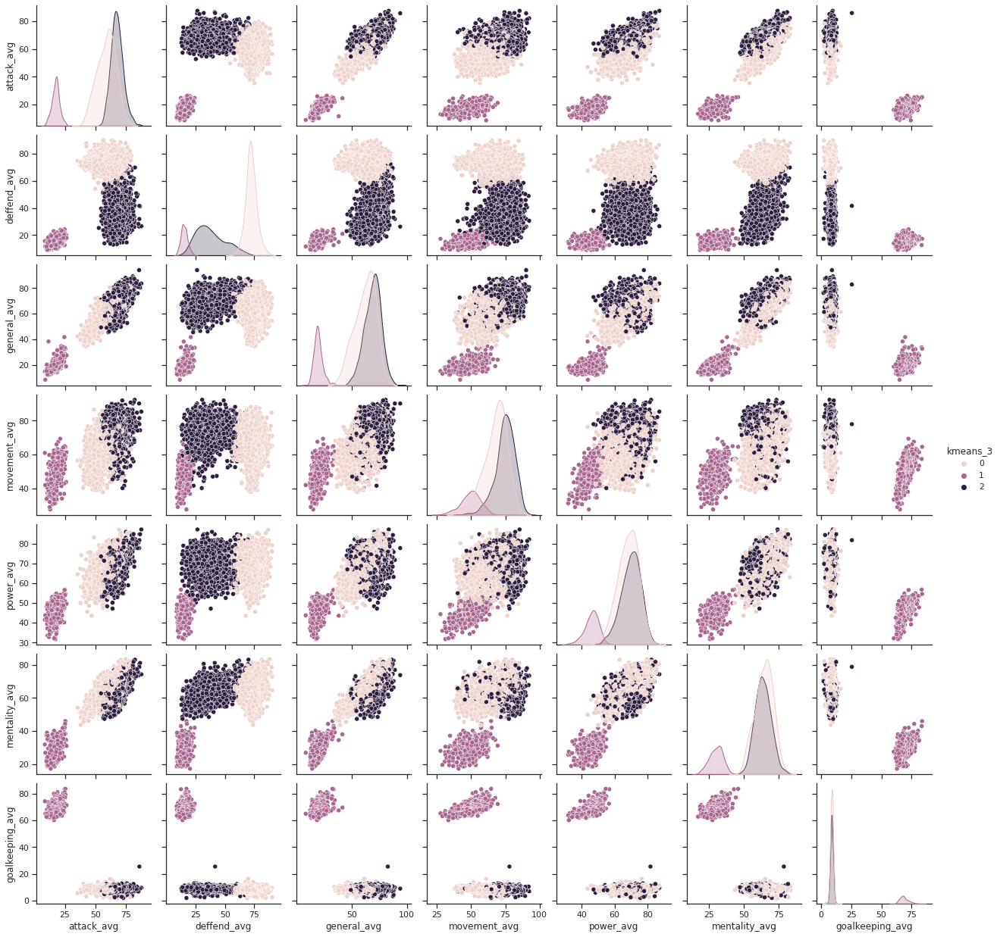

In [ ]:
# visualizamos:

sns.pairplot(df_clusters, x_vars=avg_cols, y_vars=avg_cols, hue = 'kmeans_3')

In [ ]:
df_clusters.groupby('kmeans_3')[avg_cols].describe()

attack_avg                                                      \
              count       mean       std   min    25%   50%   75%   max   
kmeans_3                                                                  
0            2384.0  58.967617  7.682993  35.4  53.55  59.6  64.6  79.6   
1             444.0  17.450000  3.195556   8.6  15.40  17.6  19.4  26.4   
2            1765.0  67.626516  5.109342  52.8  64.20  67.2  70.8  87.6   

         deffend_avg                                                         \
               count       mean        std        min        25%        50%   
kmeans_3                                                                      
0             2384.0  72.242450   4.916920  53.666667  69.333333  72.000000   
1              444.0  15.421171   2.863248   9.000000  13.333333  15.333333   
2             1765.0  38.000944  12.474592  13.000000  28.333333  35.666667   

                               general_avg                                   \
                75%        max       count       mean       std   min   25%   
kmeans_3                                                                      
0         75.000000  90.000000      2384.0  62.064010  9.587482  34.6  55.4   
1         17.083333  24.333333       444.0  19.936036  4.188284   8.6  17.4   
2         46.333333  72.666667      1765.0  69.064363  7.482804  45.6  64.2   

                           movement_avg                                   \
           50%   75%   max        count       mean       std   min   25%   
kmeans_3                                                                   
0         63.2  69.4  85.2       2384.0  67.591191  8.820723  37.8  62.4   
1         19.4  21.8  41.8        444.0  49.651802  7.200095  27.6  45.2   
2         69.8  74.2  94.0       1765.0  74.592635  7.316162  40.2  70.8   

                           power_avg                                          \
           50%   75%   max     count       mean       std   min    25%   50%   
kmeans_3                                                                       
0         68.8  73.8  88.2    2384.0  68.167701  6.368131  43.6  63.80  68.6   
1         50.2  54.6  69.4     444.0  46.005856  4.341397  31.8  43.55  46.6   
2         75.2  79.6  92.4    1765.0  69.813598  6.035289  47.2  66.00  70.2   

                     mentality_avg                                             \
           75%   max         count       mean       std        min        25%   
kmeans_3                                                                        
0         72.8  87.0        2384.0  64.526636  6.585233  43.666667  60.000000   
1         49.0  56.8         444.0  30.108108  4.920265  17.166667  26.666667   
2         74.2  87.2        1765.0  63.792351  5.772776  47.333333  59.666667   

                                          goalkeeping_avg             \
                50%        75%        max           count       mean   
kmeans_3                                                               
0         65.000000  69.333333  83.500000          2384.0   8.782369   
1         30.333333  33.666667  46.000000           444.0  68.920045   
2         63.666667  67.666667  83.166667          1765.0   8.807649   

                                                                           
               std        min        25%        50%        75%        max  
kmeans_3                                                                   
0         1.302277   1.666667   8.000000   8.833333   9.666667  16.333333  
1         3.892627  60.166667  66.333333  68.166667  71.333333  83.666667  
2         1.330709   2.000000   8.000000   8.833333   9.666667  25.500000

In [ ]:
pd.crosstab(df_clusters.kmeans_4,df_clusters.kmeans_3)

kmeans_3,0,1,2
kmeans_4,,,
0,1460,0,266
1,0,444,0
2,0,0,1499
3,924,0,0


El cluster 1 se comporta exactamente igual que en el modelo anterior. La diferencia se encuentra entre los clusters 0 y 2. Aquí:

* El cluster 2 tiene altos resultados en ataque y más bajos en defensa. Además, su valoración promedio es mejor en las habilidades grl, movimiento y poder. 
* El cluster 0 también tienen altos resultados en ataque, aunque casi 9 puntos en promedio por debajo del cluster 2. En las habilidades grl, de movimeinto y poder se encuentra levemente por debajo del cluster 2. En cambio, en la habilidad de mentalidad, su promedio se encuentra apenas por encima. La gran diferencial de este cluster es la habilidad de defensa, donde le saca más de 30 puntos promedio al cluster 2 y más de 50 puntos promedio al 1. 

Es decir, este modelo esta separando a los arqueros por un lado, y entre los otros dos, separa a los que pueden de los que no pueden defender. 

El cluster 0 absorbe a todos los jugadores del cluster 3 del modelo anterior (los que eran mejores defensores); el cluster 1 a todos los jugadores del cluster 1 anterior (arqueros); y el cluster 2 a todos los que estaban en el cluster 2 del modelo anterior (los que eran buenos en el ataque y malos en la defensa). El cluster 0 del modelo anterior (compuesto por los jugadores más flexibles, que podían atacar y defender) se reparte entre los clusters 0 y 2 del modelo actual; por lo que este segmento de jugadores flexibles no es diferenciado con este modelo.  

In [ ]:
pd.crosstab(df_clusters.positions,df_clusters.kmeans_3)

kmeans_3,0,1,2
positions,,,
defender,1485,0,0
forward,5,0,886
goalkeeper,0,444,0
midfielder,894,0,879


Comparando con las posiciones originales, observamos que separa a los defensores y los delanteros en dos clusters separados y luego, en partes casi iguales, a los mediocampistas.

## Conclusiones

En función del analisis realizado, creemos que el modelo kmeans_4 podría ser el más adecuado, ya que no solo distingue grupos de jugadores bien delimitados (como aquellos que solo son buenos para el ataque o para la defensa o para la portería), sino que también nos provee un segmento de jugadores flexibles o comodines que pueden jugar diferentes posiciones, algo que puede ser util cuando se piensa en armar un equipo. 

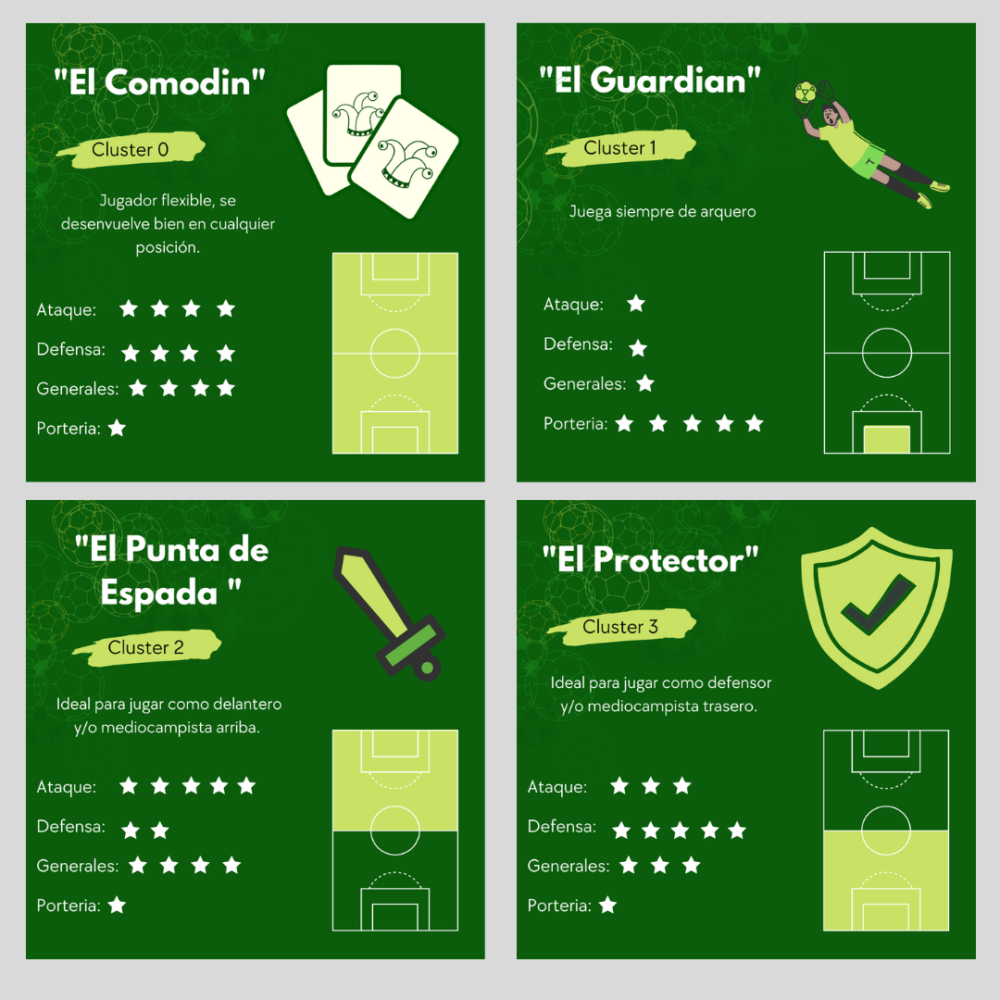